In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 16
GEN_IN_CHANNELS = 1
GEN_N_CLASSES = 1
DIS_IN_CHANNELS = 1
DIS_N_CLASSES = 1
EPOCH = 100

### Model Settings

#### head

In [5]:
GEN_ACT = "sigmoid"
DIS_ACT = "sigmoid"

### Optimizer Settings

In [6]:
ENCODER = "resnet34"
ENCODER_WEIGHT = None
DECODER_ATT = "scse"
GEN_OPTIM_NAME = "adam"
GEN_init_lr = 3e-4
GEN_momentum = 0.9

In [7]:
DIS_OPTIM_NAME = "adam"
DIS_init_lr = 1e-3
DIS_momentum = 0.9

# Epochs

In [8]:
from codes.activation import Activation
from kornia.filters.canny import Canny

In [9]:
def set_requires_grad(nets, requires_grad=False):
    """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
    Parameters:
    nets (network list)   -- a list of networks
    requires_grad (bool)  -- whether the networks require gradients or not
    """
    if not isinstance(nets, list):
        nets = [nets]
        for net in nets:
            if net is not None:
                for param in net.parameters():
                    param.requires_grad = requires_grad

In [10]:
def replace_relu_to_leakyReLU(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.LeakyReLU())
        else:
            replace_relu_to_leakyReLU(child)

In [11]:
def replace_bn_to_instanceNorm(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.BatchNorm2d):
            bn = getattr(model, child_name)
            setattr(model, child_name, nn.InstanceNorm2d(bn.num_features))
        else:
            replace_bn_to_instanceNorm(child)

In [12]:
canny_filter = Canny(low_threshold=0, high_threshold=0.1).to(device)

In [13]:
def train_a2b_epoch(generator, gen_optimizer, discriminator, dis_optimizer, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.train().to(device)
    discriminator = discriminator.train().to(device)
    
    dis_l = 0
    gen_l = 0

    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        set_requires_grad(discriminator, True)
        dis_optimizer.zero_grad()
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        
        y_pr_cls = discriminator(edge_y_pr.detach())
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
       
        _dis = nn.BCELoss()(y_cls.float(), torch.zeros(y_cls.size(), dtype=torch.float, device=device)) + \
                                nn.BCELoss()(y_pr_cls.float(), torch.ones(y_pr_cls.size(), dtype=torch.float, device=device))

        _dis.backward()
        dis_optimizer.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        set_requires_grad(discriminator, False)
        gen_optimizer.zero_grad()

        # adversarial loss
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        _gen = nn.BCELoss()(y_pr_cls.float(), torch.zeros(y_pr_cls.size(), dtype=torch.float, device=device))

        _gen.backward()    
        gen_optimizer.step()

        dis_l += _dis.item()
        gen_l += _gen.item()
        
    return  gen_l/(index+1), dis_l/(index+1)

In [14]:
@torch.no_grad()
def eval_epoch(generator, discriminator, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.eval().to(device)
    discriminator = discriminator.eval().to(device)

    acc_ = []
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        
        # adversarial
        acc = Accuracy()(y_cls, torch.zeros(y_cls.size(), device=y_cls.device))
        acc_ += [acc.item()]
        acc = Accuracy()(y_pr_cls, torch.ones(y_pr_cls.size(), device=y_pr_cls.device))
        acc_ += [acc.item()]


    return  sum(acc_)/len(acc_)

In [15]:
@torch.no_grad()
def test_epoch(model, dataloader, device, save=False, path=None):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    
    iid = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = model(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)   
        
        for b in range(x.shape[0]):
            
            print("edge of ct_pred = {}, edge of ct_true = {}".format(y_pr_cls[b, :].squeeze().item(), y_cls[b, :].squeeze().item()))
            print(torch.min(edge_y[b, :]), torch.max(edge_y[b, :]), torch.min(edge_y_pr[b, :]), torch.max(edge_y_pr[b, :]))
            
            _edge = edge_y[b, :].squeeze().cpu().numpy()
            _edge_pr = edge_y_pr[b, :].squeeze().cpu().numpy()
            
            visualize(
                edge_true = _edge,
                edge_pred = _edge_pr
            )
            
            if save:
                path_dir = os.path.join(path, "file_{}".format(iid))
                try:
                    os.mkdir(path_dir)
                except FileExistsError:
                    pass
                
                cv2.imwrite(os.path.join(path_dir, "edge_pred.jpg"), (_edge_pr * 255).astype(np.uint8))
                cv2.imwrite(os.path.join(path_dir, "edge_true.jpg"), (_edge * 255).astype(np.uint8))
                
            iid += 1

# Discriminator

In [16]:
from codes.activation import Activation
import torchvision.models as models

In [17]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet34()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=512, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# Read Data

In [18]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [19]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [20]:
trainset = Dataset(train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [21]:
len(trainset), len(testset)

(1344, 191)

In [22]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7f11173b51f0>,)

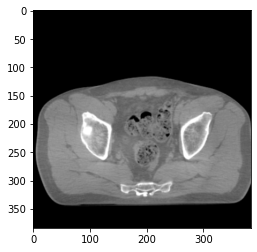

In [23]:
plt.imshow(x.squeeze(), 'gray'),

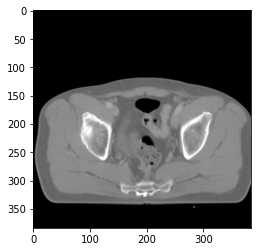

In [24]:
plt.imshow(y.squeeze(), 'gray')

In [25]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# training

In [26]:
import wandb

wandb.init(project="cbct_edge", config={
    "data": {
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "in_channels": GEN_IN_CHANNELS,
        "out_channels": GEN_N_CLASSES,
        "optimizer": GEN_OPTIM_NAME,
        "init_lr": GEN_init_lr,
        "momentum": GEN_momentum,
        "encoder": ENCODER,
        "encoder_weight": ENCODER_WEIGHT,
        "activation": GEN_ACT,
        "decoder_attention_type": DECODER_ATT
    },
    "discriminator": {
        "in_channels": DIS_IN_CHANNELS,
        "out_channels": DIS_N_CLASSES,
        "optimizer": DIS_OPTIM_NAME,
        "init_lr": DIS_init_lr,
        "momentum": DIS_momentum,
        "encoder": "resnet152"
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)


In [27]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [28]:
import segmentation_models_pytorch as smp
import torchvision.models as models

model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [29]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [30]:
models.resnet34()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [31]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
gen_optimizer = Optimizer(model.parameters(), name=GEN_OPTIM_NAME, lr=GEN_init_lr)
dis_optimizer = Optimizer(discriminator.parameters(), name=DIS_OPTIM_NAME, lr=DIS_init_lr)

In [32]:
wandb.watch(model)
wandb.watch(discriminator)

max_score = 0

for epoch in range(EPOCH):
        
        loss_gen, loss_dis = train_a2b_epoch(model, gen_optimizer, discriminator, dis_optimizer, trainloader, device)
        score_acc_train = eval_epoch(model, discriminator, trainloader, device)
        score_acc_test = eval_epoch(model, discriminator, testloader, device)

        
        wandb.log({
            "loss gen": loss_gen,
            "loss dis": loss_dis,
            "trainset acc score": score_acc_train,
            "testset acc score": score_acc_test
        })
        
        
        if score_acc_test  >  max_score:
            max_score = score_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": gen_optimizer.state_dict(),
                "dicriminator": discriminator.state_dict(),
                "dis_optim": dis_optimizer.state_dict()
            }
            torch.save(checkpoint, os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

84it [01:09,  1.22it/s]
84it [00:40,  2.10it/s]
12it [00:05,  2.20it/s]
84it [01:05,  1.28it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.18it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.18it/s]
84it [01:06,  1.26it/s]
84it [00:39,  2.11it/s]
12it [00:05,  2.19it/s]
84it [01:05,  1.28it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.19it/s]
84it [01:07,  1.25it/s]
84it [00:40,  2.05it/s]
12it [00:05,  2.19it/s]
84it [01:05,  1.27it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.19it/s]
84it [01:07,  1.25it/s]
84it [00:41,  2.04it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.27it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.27it/s]
84it [00:39,  2.11it/s]
12it [00:05,  2.20it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.20it/s]
84it [01:06,  1.26it/s]
84it [00:39,  2.10it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.10it/s]
12it [00:05,  2.20it/s]
84it [01:06,  1.27it/s]
84it [00:40,  2.10it/s]
12it [00:05,  2.

In [33]:
checkpoint = torch.load(os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

In [34]:
model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [35]:
dir_path = os.path.join("eval-edge", wandb.run.name)
try:
    os.mkdir(dir_path)
except FileExistsError:
    pass

0it [00:00, ?it/s]

edge of ct_pred = 0.6870116591453552, edge of ct_true = 0.7161002159118652
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


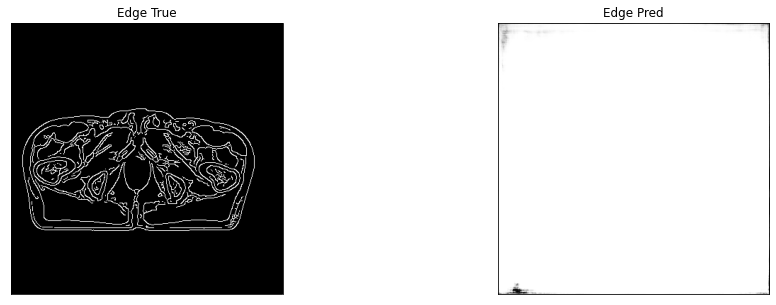

edge of ct_pred = 0.68697190284729, edge of ct_true = 0.7161440253257751
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0118, device='cuda:0') tensor(1., device='cuda:0')


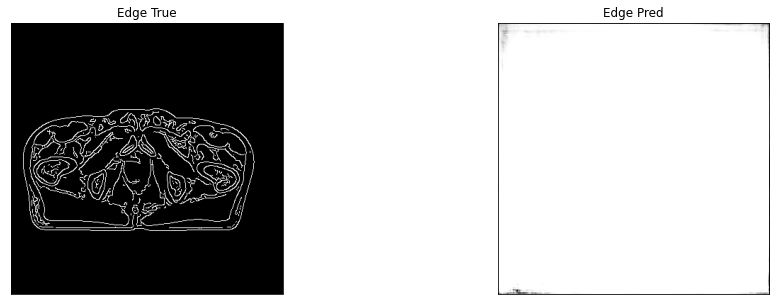

edge of ct_pred = 0.687086820602417, edge of ct_true = 0.7156111001968384
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0136, device='cuda:0') tensor(1., device='cuda:0')


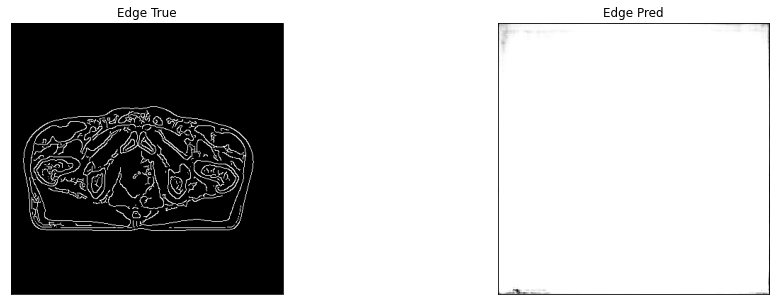

edge of ct_pred = 0.6871349215507507, edge of ct_true = 0.7161224484443665
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0081, device='cuda:0') tensor(1., device='cuda:0')


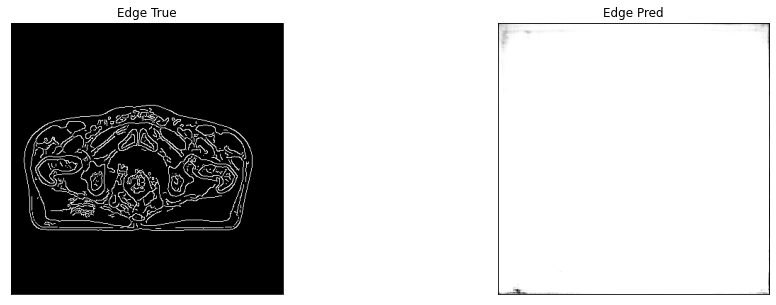

edge of ct_pred = 0.6870866417884827, edge of ct_true = 0.7158589363098145
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0078, device='cuda:0') tensor(1., device='cuda:0')


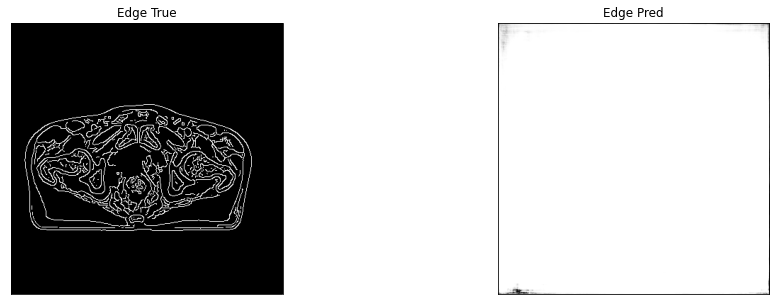

edge of ct_pred = 0.686968207359314, edge of ct_true = 0.715100884437561
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0087, device='cuda:0') tensor(1., device='cuda:0')


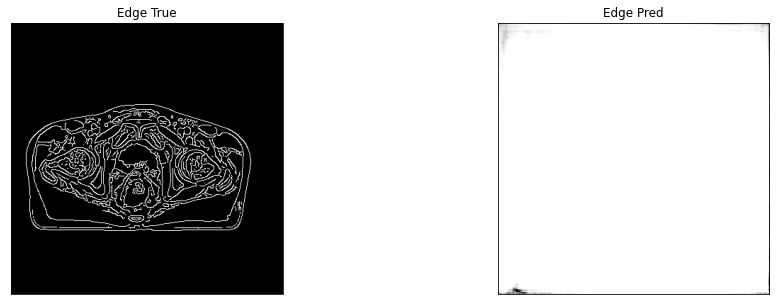

edge of ct_pred = 0.6869980096817017, edge of ct_true = 0.7154370546340942
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0059, device='cuda:0') tensor(1., device='cuda:0')


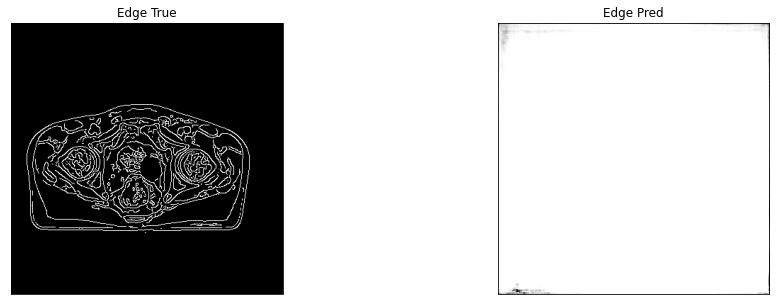

edge of ct_pred = 0.6871203184127808, edge of ct_true = 0.7160738706588745
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0068, device='cuda:0') tensor(1., device='cuda:0')


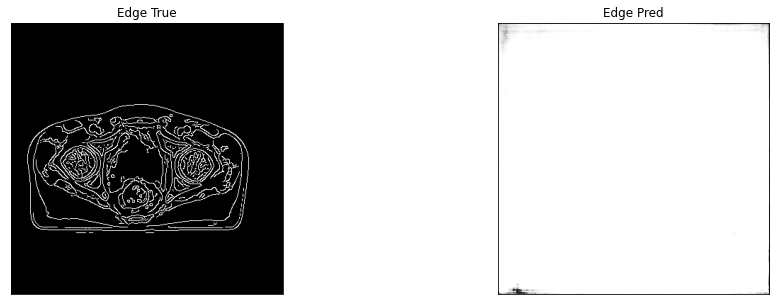

edge of ct_pred = 0.6870630383491516, edge of ct_true = 0.7166956067085266
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0075, device='cuda:0') tensor(1., device='cuda:0')


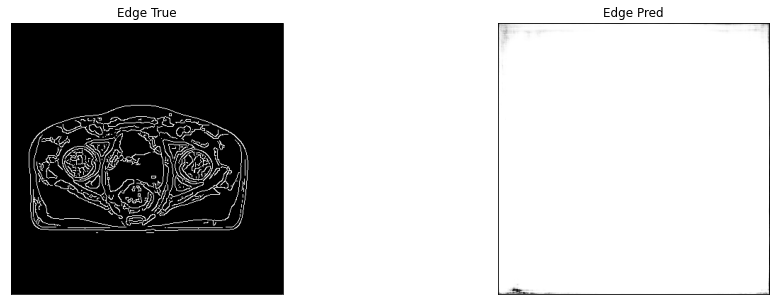

edge of ct_pred = 0.6870042085647583, edge of ct_true = 0.7180517315864563
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0094, device='cuda:0') tensor(1., device='cuda:0')


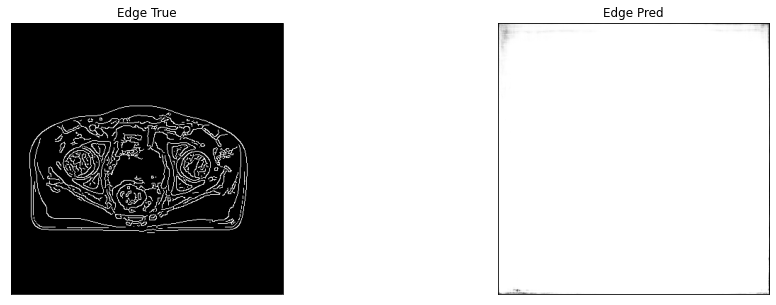

edge of ct_pred = 0.6870192885398865, edge of ct_true = 0.7183889746665955
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0161, device='cuda:0') tensor(1., device='cuda:0')


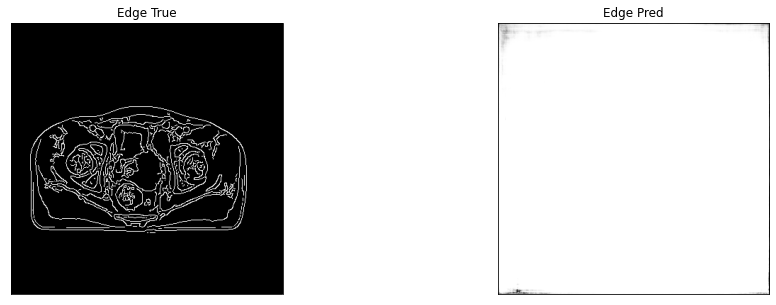

edge of ct_pred = 0.6870833039283752, edge of ct_true = 0.7189939022064209
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0055, device='cuda:0') tensor(1., device='cuda:0')


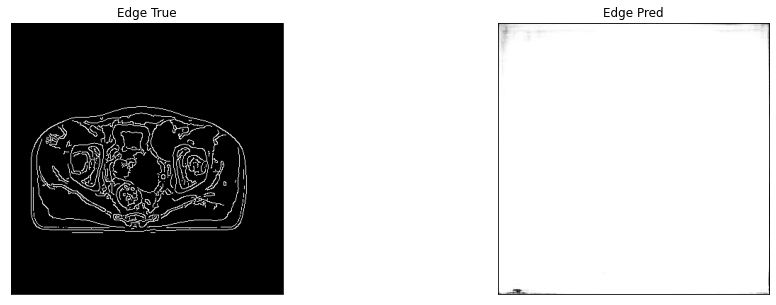

edge of ct_pred = 0.6867040991783142, edge of ct_true = 0.7184495329856873
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0087, device='cuda:0') tensor(1., device='cuda:0')


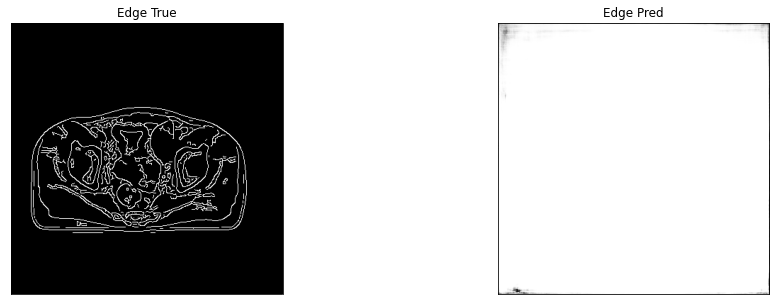

edge of ct_pred = 0.6869034171104431, edge of ct_true = 0.719935417175293
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0051, device='cuda:0') tensor(1., device='cuda:0')


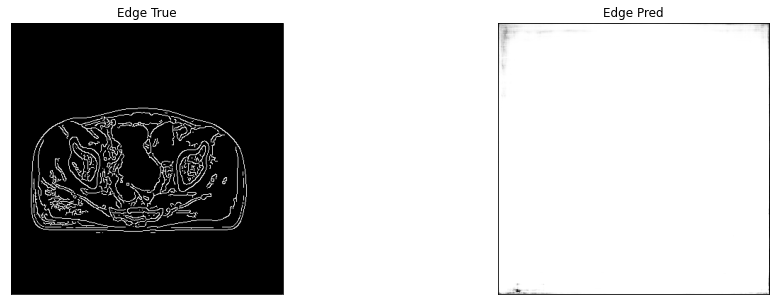

edge of ct_pred = 0.6871540546417236, edge of ct_true = 0.719783365726471
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0111, device='cuda:0') tensor(1., device='cuda:0')


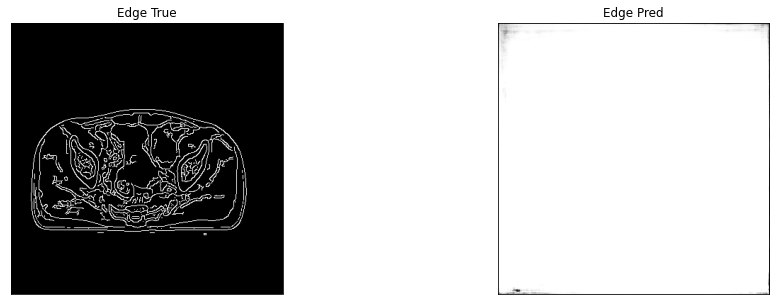

edge of ct_pred = 0.6869869232177734, edge of ct_true = 0.7196444272994995
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0077, device='cuda:0') tensor(1., device='cuda:0')


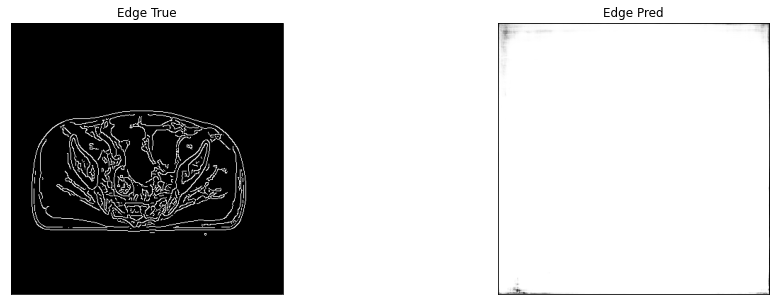

1it [00:03,  3.34s/it]

edge of ct_pred = 0.6867590546607971, edge of ct_true = 0.7197843790054321
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0092, device='cuda:0') tensor(1., device='cuda:0')


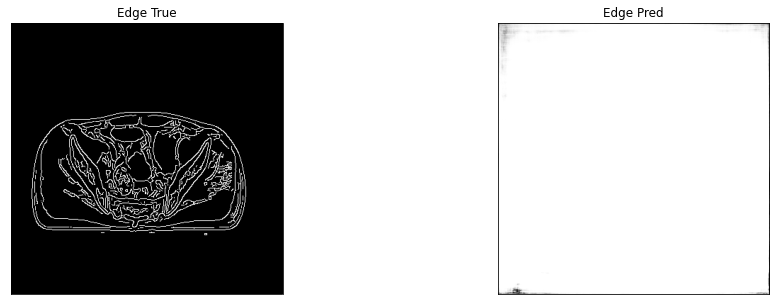

edge of ct_pred = 0.6867770552635193, edge of ct_true = 0.7202432155609131
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0200, device='cuda:0') tensor(1., device='cuda:0')


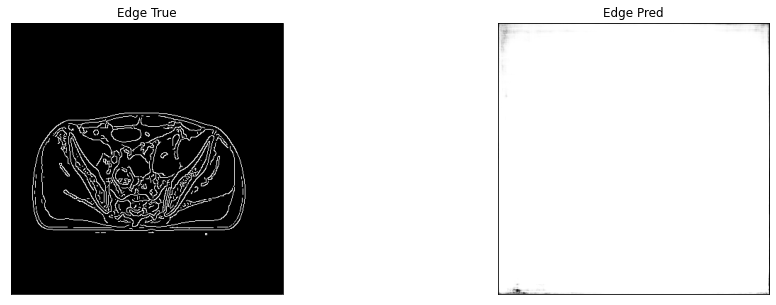

edge of ct_pred = 0.687000572681427, edge of ct_true = 0.7195793390274048
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0116, device='cuda:0') tensor(1., device='cuda:0')


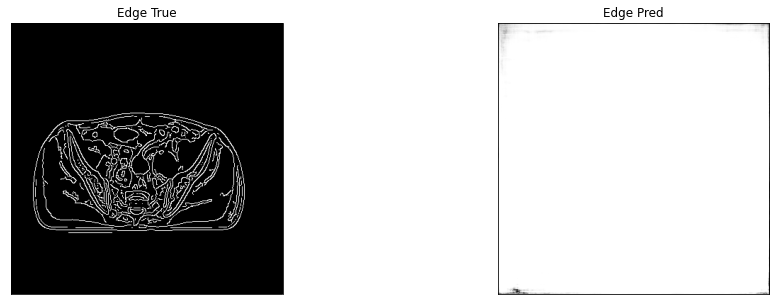

edge of ct_pred = 0.6869702935218811, edge of ct_true = 0.7200062274932861
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0103, device='cuda:0') tensor(1., device='cuda:0')


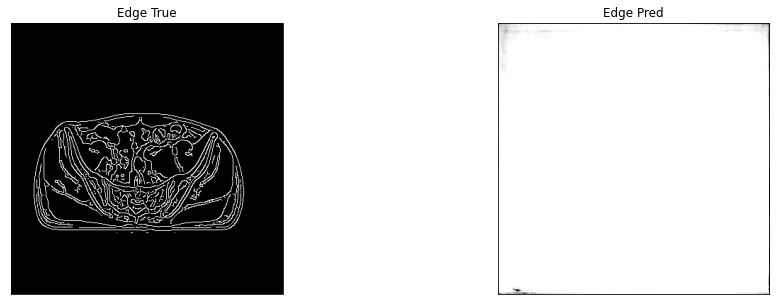

edge of ct_pred = 0.6869957447052002, edge of ct_true = 0.7202263474464417
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0088, device='cuda:0') tensor(1., device='cuda:0')


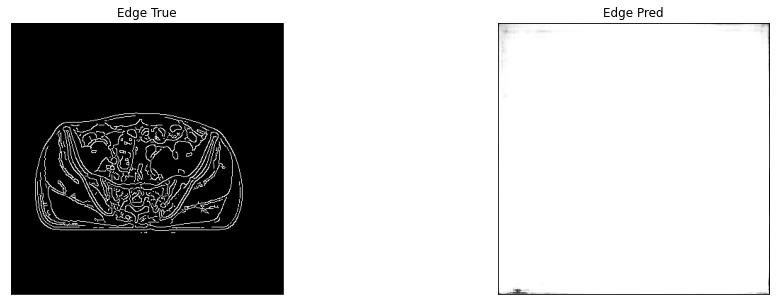

edge of ct_pred = 0.687102735042572, edge of ct_true = 0.7213611602783203
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0118, device='cuda:0') tensor(1., device='cuda:0')


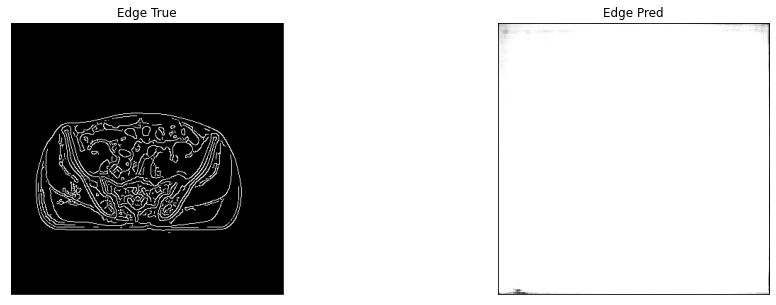

edge of ct_pred = 0.6869937181472778, edge of ct_true = 0.7208989858627319
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0052, device='cuda:0') tensor(1., device='cuda:0')


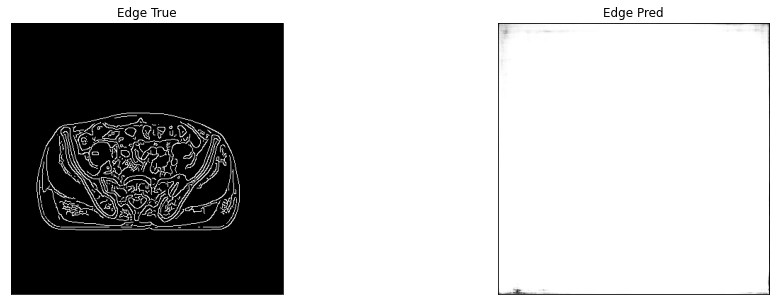

edge of ct_pred = 0.6870712637901306, edge of ct_true = 0.7210137248039246
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


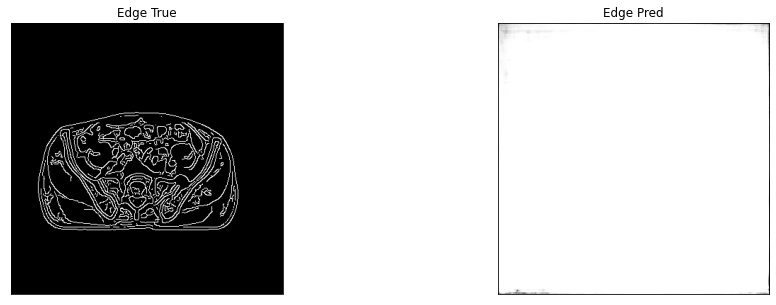

edge of ct_pred = 0.6869134902954102, edge of ct_true = 0.721398115158081
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0103, device='cuda:0') tensor(1., device='cuda:0')


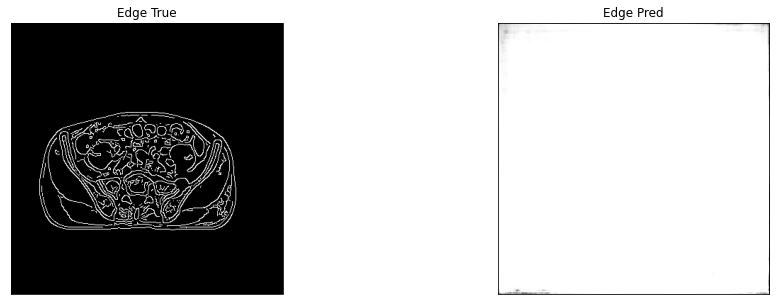

edge of ct_pred = 0.6869001984596252, edge of ct_true = 0.7214789390563965
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0156, device='cuda:0') tensor(1., device='cuda:0')


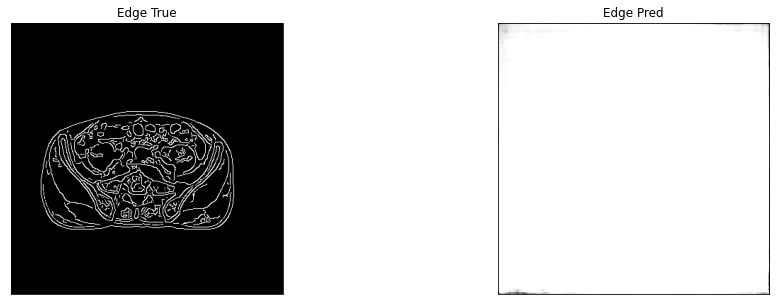

edge of ct_pred = 0.6870704889297485, edge of ct_true = 0.7220492959022522
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0099, device='cuda:0') tensor(1., device='cuda:0')


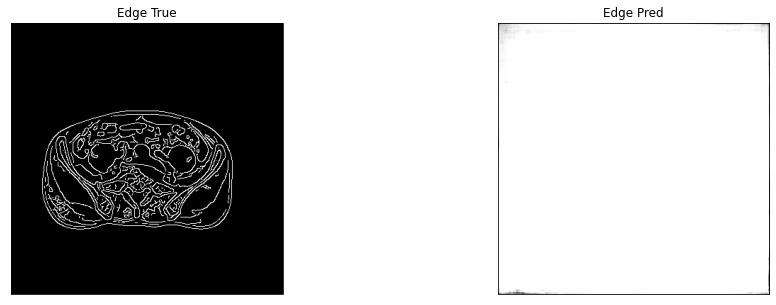

edge of ct_pred = 0.6869220733642578, edge of ct_true = 0.7227619290351868
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0136, device='cuda:0') tensor(1., device='cuda:0')


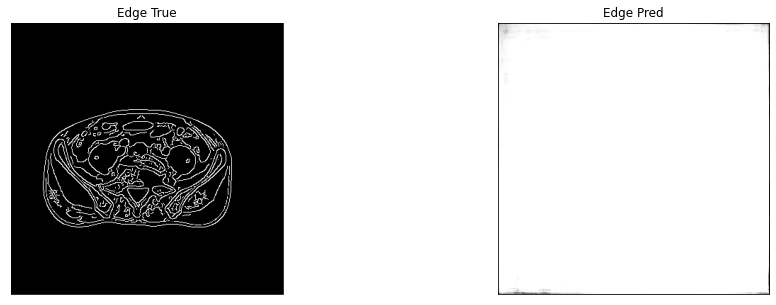

edge of ct_pred = 0.6871486902236938, edge of ct_true = 0.6990725994110107
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


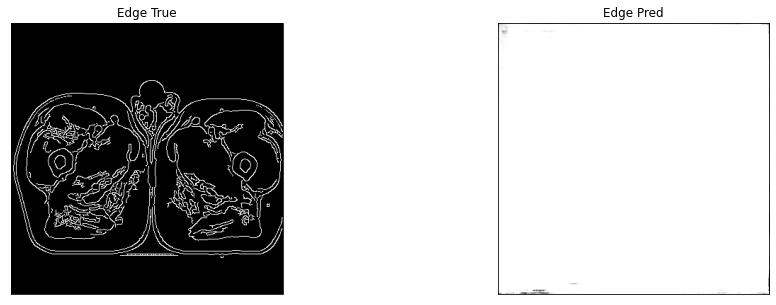

edge of ct_pred = 0.6872631907463074, edge of ct_true = 0.6969555616378784
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


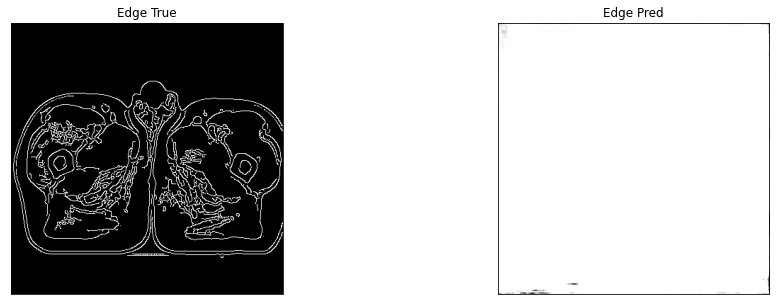

edge of ct_pred = 0.6873018145561218, edge of ct_true = 0.6947407722473145
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


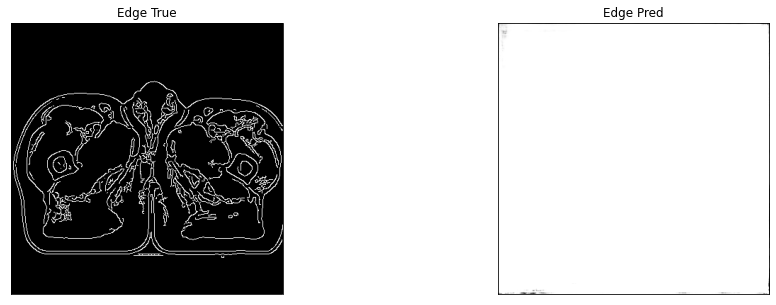

edge of ct_pred = 0.6872824430465698, edge of ct_true = 0.6949531435966492
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


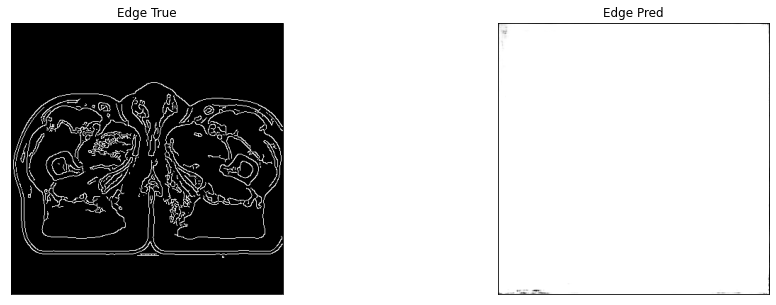

2it [00:05,  3.00s/it]

edge of ct_pred = 0.6871465444564819, edge of ct_true = 0.6966685056686401
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2239e-05, device='cuda:0') tensor(1., device='cuda:0')


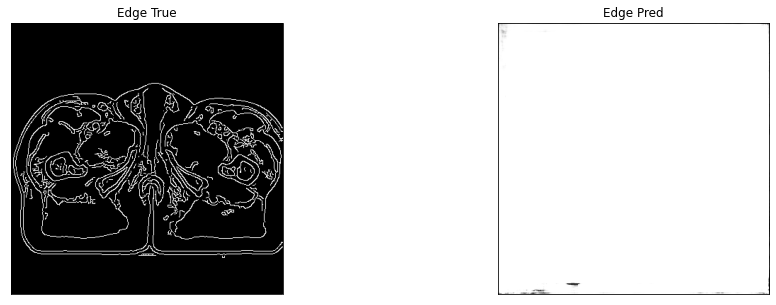

edge of ct_pred = 0.6873186230659485, edge of ct_true = 0.6934385895729065
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.6624e-05, device='cuda:0') tensor(1., device='cuda:0')


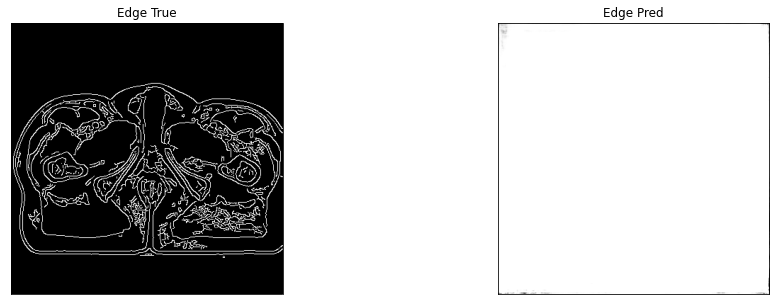

edge of ct_pred = 0.6871875524520874, edge of ct_true = 0.6953222155570984
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.8982e-05, device='cuda:0') tensor(1., device='cuda:0')


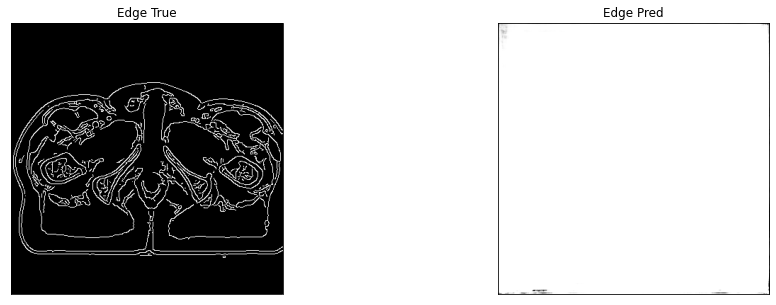

edge of ct_pred = 0.6873067617416382, edge of ct_true = 0.6956552863121033
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.0345e-05, device='cuda:0') tensor(1., device='cuda:0')


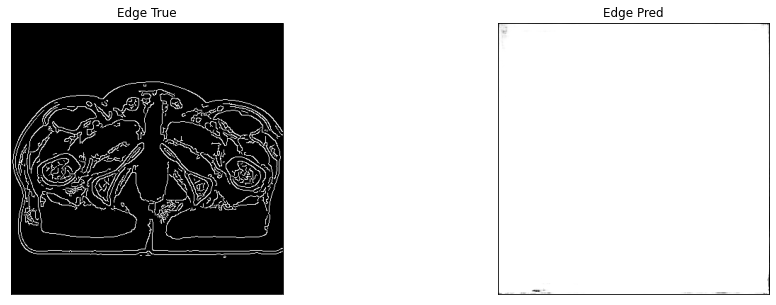

edge of ct_pred = 0.6872520446777344, edge of ct_true = 0.6944443583488464
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


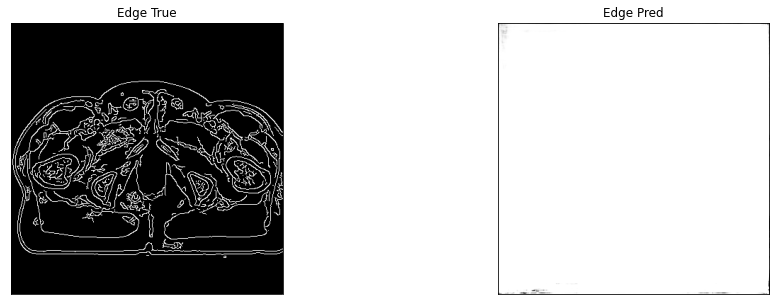

edge of ct_pred = 0.6871921420097351, edge of ct_true = 0.6931089758872986
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


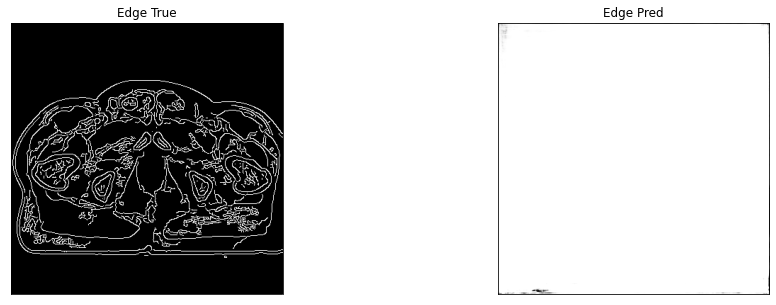

edge of ct_pred = 0.6872272491455078, edge of ct_true = 0.6940342783927917
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.9394e-05, device='cuda:0') tensor(1., device='cuda:0')


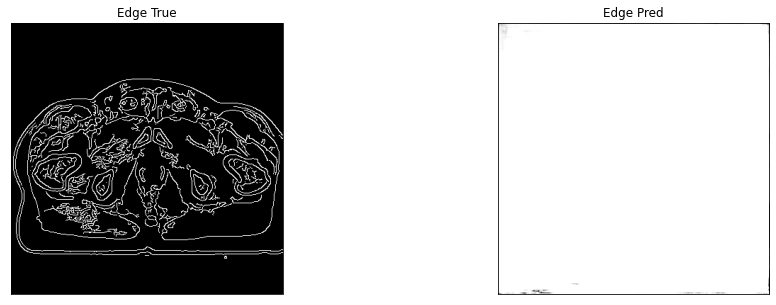

edge of ct_pred = 0.6873393058776855, edge of ct_true = 0.692621648311615
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0012, device='cuda:0') tensor(1., device='cuda:0')


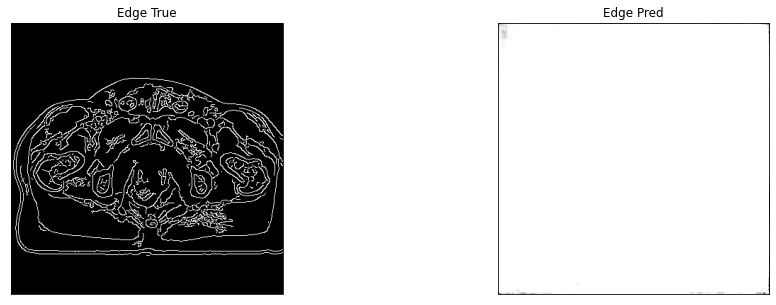

edge of ct_pred = 0.6871442794799805, edge of ct_true = 0.692574679851532
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


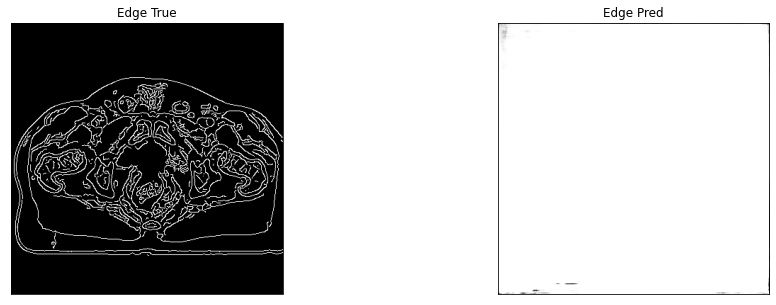

edge of ct_pred = 0.6870893836021423, edge of ct_true = 0.6917870044708252
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


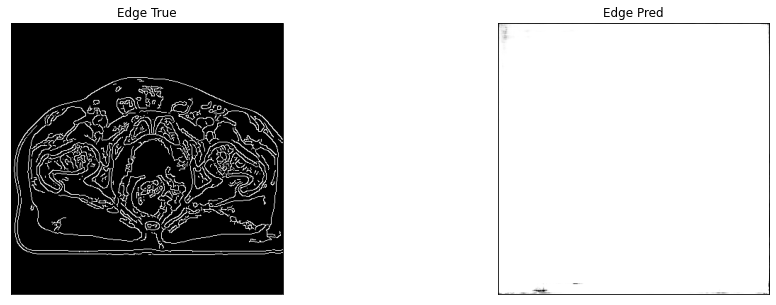

edge of ct_pred = 0.6872496604919434, edge of ct_true = 0.6916462779045105
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.3555e-05, device='cuda:0') tensor(1., device='cuda:0')


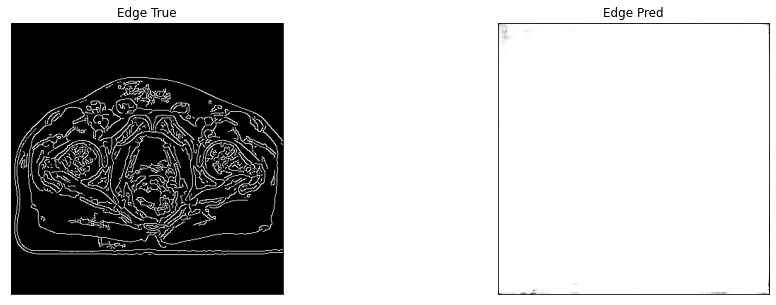

edge of ct_pred = 0.6872223019599915, edge of ct_true = 0.6908000111579895
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


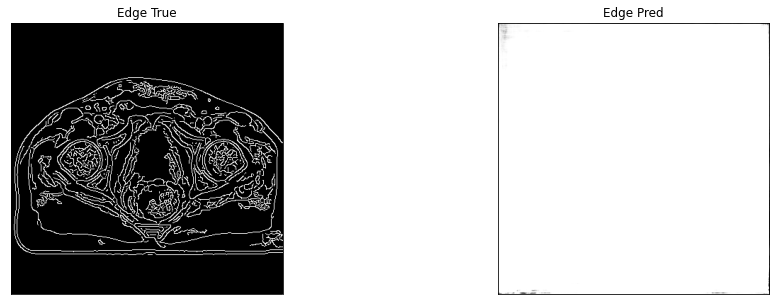

edge of ct_pred = 0.6872041821479797, edge of ct_true = 0.6909047365188599
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


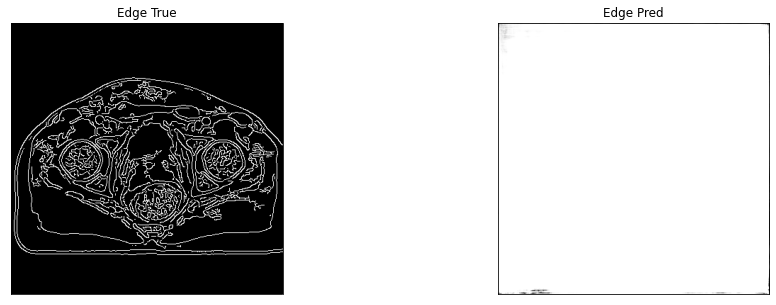

edge of ct_pred = 0.6871949434280396, edge of ct_true = 0.688198447227478
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


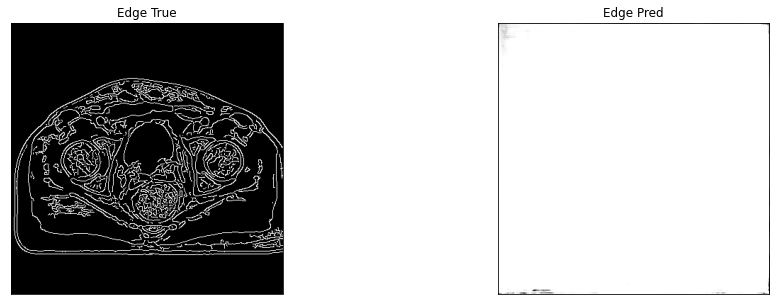

edge of ct_pred = 0.6871857643127441, edge of ct_true = 0.692826509475708
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


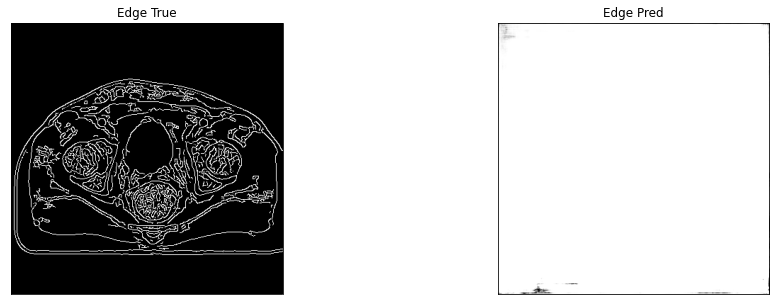

edge of ct_pred = 0.6873095631599426, edge of ct_true = 0.6920677423477173
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


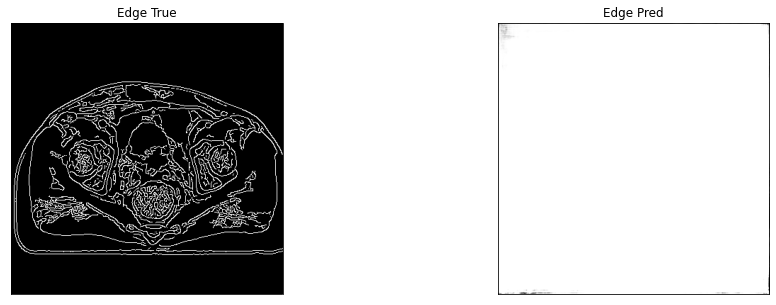

3it [00:07,  2.77s/it]

edge of ct_pred = 0.6871373653411865, edge of ct_true = 0.6929256916046143
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0007, device='cuda:0') tensor(1., device='cuda:0')


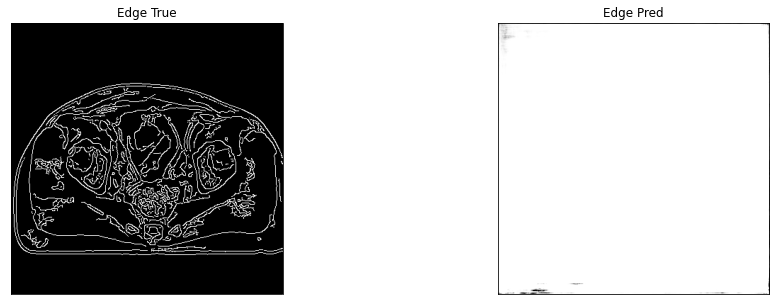

edge of ct_pred = 0.6869384050369263, edge of ct_true = 0.6943285465240479
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


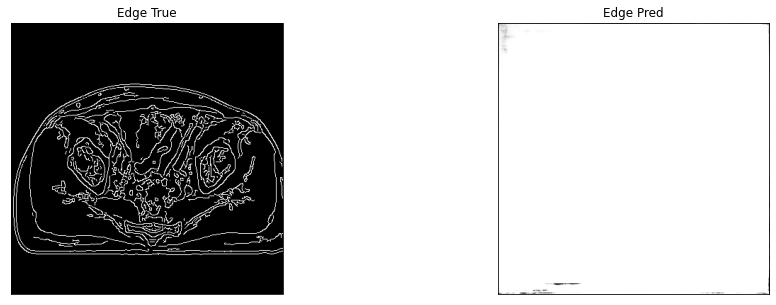

edge of ct_pred = 0.6872535347938538, edge of ct_true = 0.6956958770751953
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


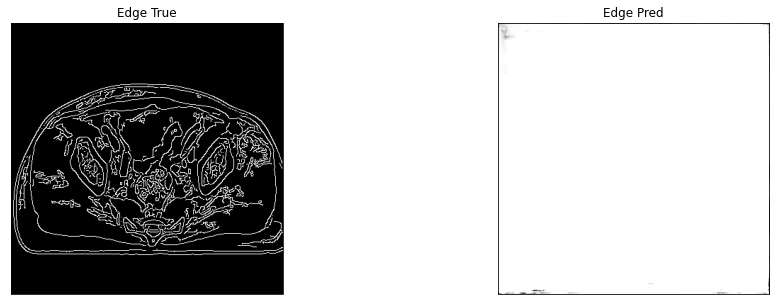

edge of ct_pred = 0.6872768998146057, edge of ct_true = 0.6941701173782349
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


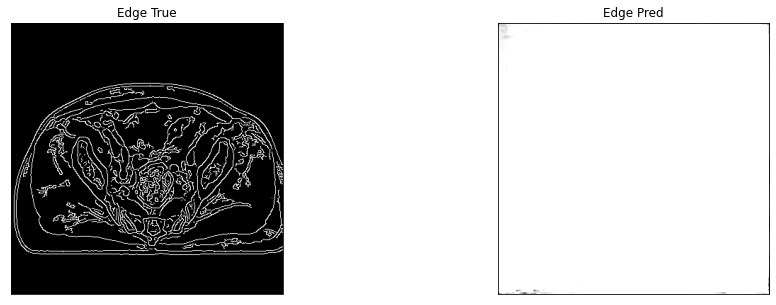

edge of ct_pred = 0.6871994733810425, edge of ct_true = 0.6922687292098999
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


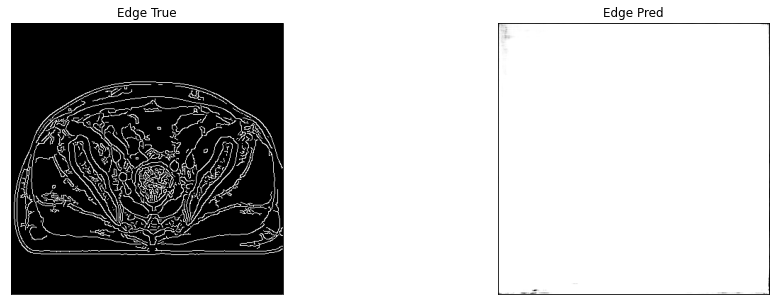

edge of ct_pred = 0.6870352625846863, edge of ct_true = 0.692274808883667
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


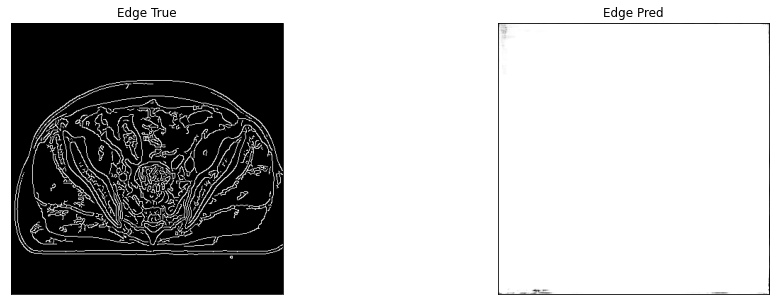

edge of ct_pred = 0.6873816847801208, edge of ct_true = 0.6929367184638977
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


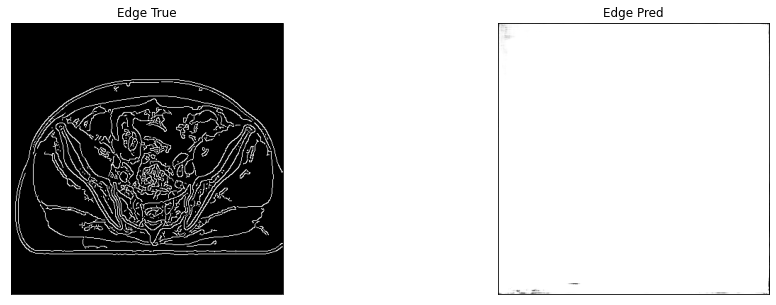

edge of ct_pred = 0.6872007250785828, edge of ct_true = 0.7173382639884949
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


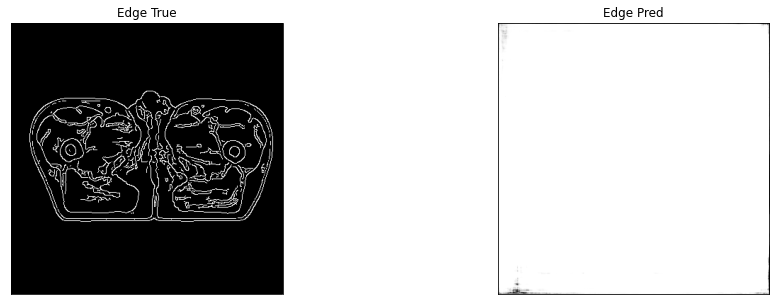

edge of ct_pred = 0.6872634887695312, edge of ct_true = 0.7173919677734375
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0027, device='cuda:0') tensor(1., device='cuda:0')


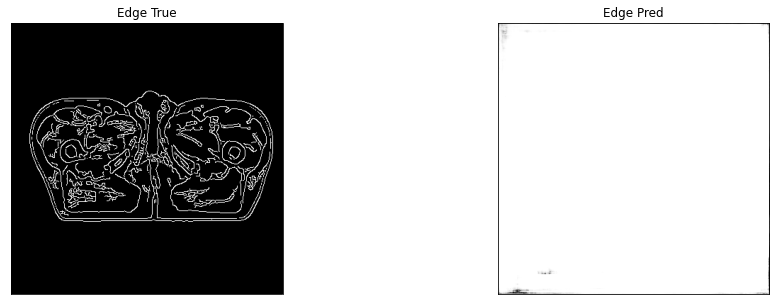

edge of ct_pred = 0.6872885823249817, edge of ct_true = 0.716946005821228
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


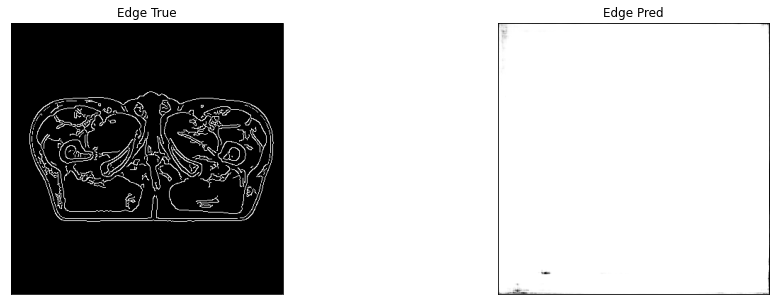

edge of ct_pred = 0.68716961145401, edge of ct_true = 0.7165802717208862
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


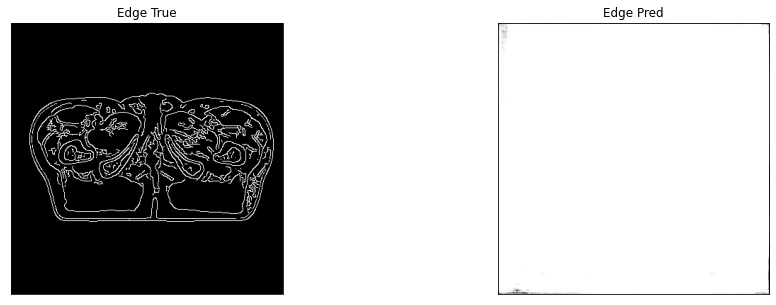

edge of ct_pred = 0.6872939467430115, edge of ct_true = 0.7171869874000549
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0026, device='cuda:0') tensor(1., device='cuda:0')


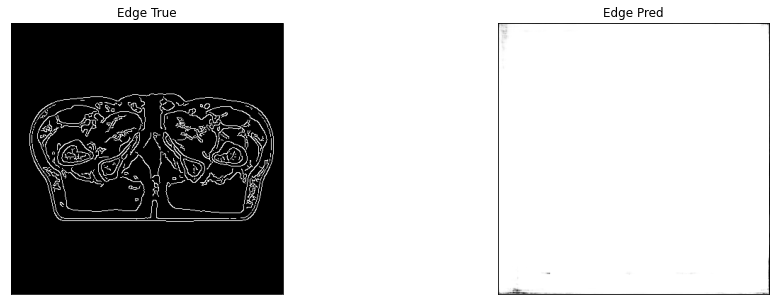

edge of ct_pred = 0.6872350573539734, edge of ct_true = 0.7166351675987244
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


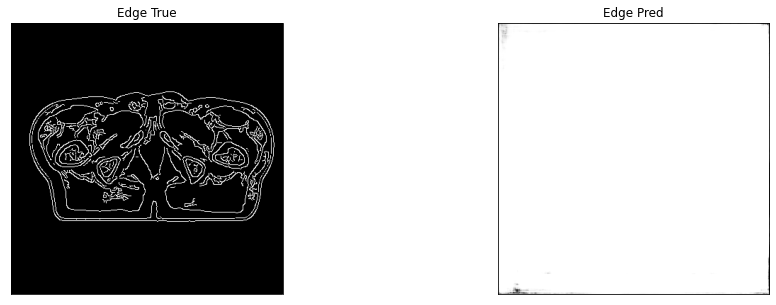

edge of ct_pred = 0.6871610879898071, edge of ct_true = 0.7166277170181274
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


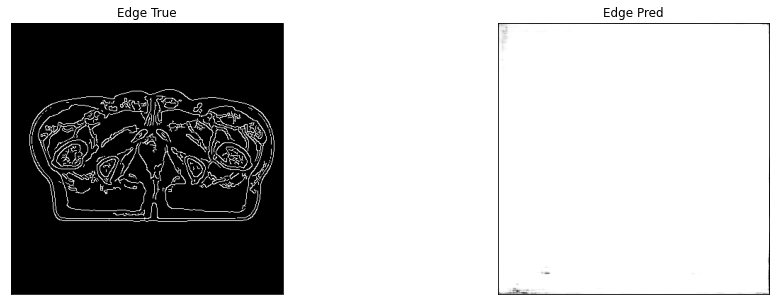

edge of ct_pred = 0.6871077418327332, edge of ct_true = 0.7169457674026489
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0029, device='cuda:0') tensor(1., device='cuda:0')


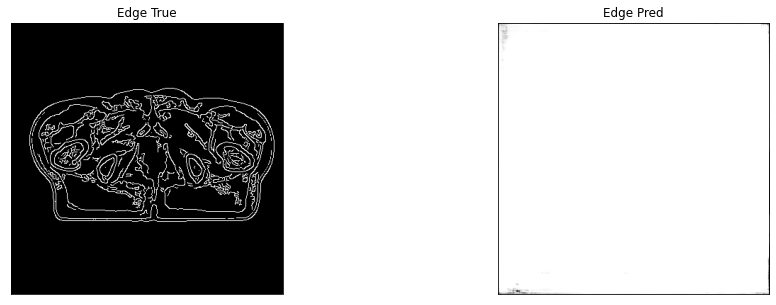

edge of ct_pred = 0.6872178316116333, edge of ct_true = 0.7173044085502625
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0035, device='cuda:0') tensor(1., device='cuda:0')


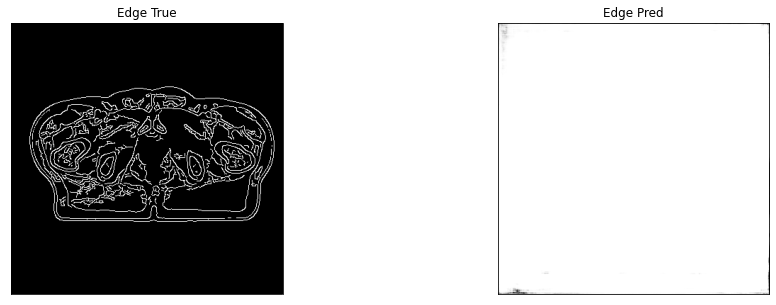

4it [00:10,  2.65s/it]

edge of ct_pred = 0.6871740818023682, edge of ct_true = 0.7164909839630127
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0034, device='cuda:0') tensor(1., device='cuda:0')


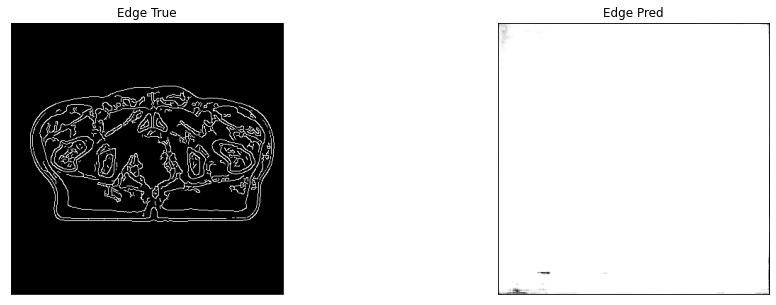

edge of ct_pred = 0.6871729493141174, edge of ct_true = 0.7165701985359192
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


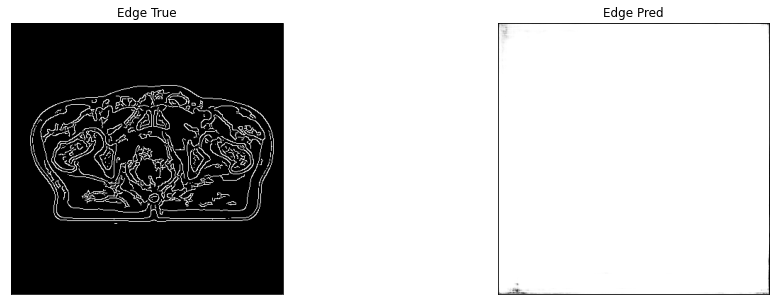

edge of ct_pred = 0.6871820688247681, edge of ct_true = 0.7154892086982727
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0016, device='cuda:0') tensor(1., device='cuda:0')


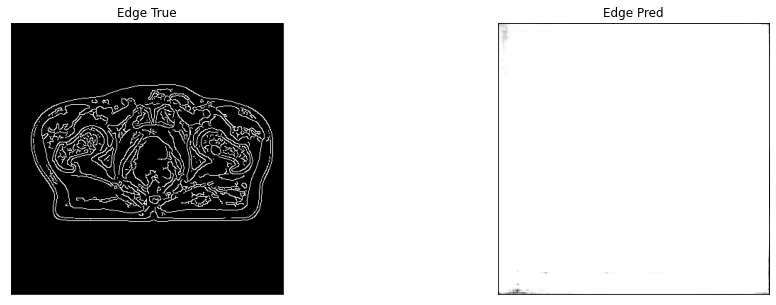

edge of ct_pred = 0.6871272921562195, edge of ct_true = 0.7155565619468689
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


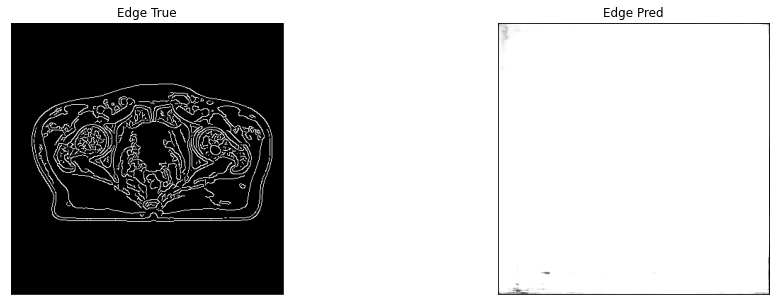

edge of ct_pred = 0.6871824264526367, edge of ct_true = 0.7158834934234619
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0026, device='cuda:0') tensor(1., device='cuda:0')


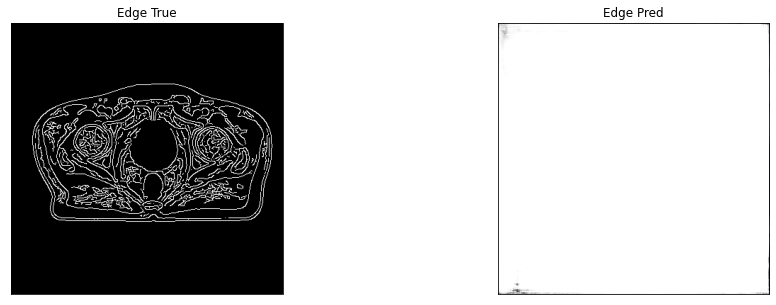

edge of ct_pred = 0.6871917843818665, edge of ct_true = 0.7160595655441284
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0026, device='cuda:0') tensor(1., device='cuda:0')


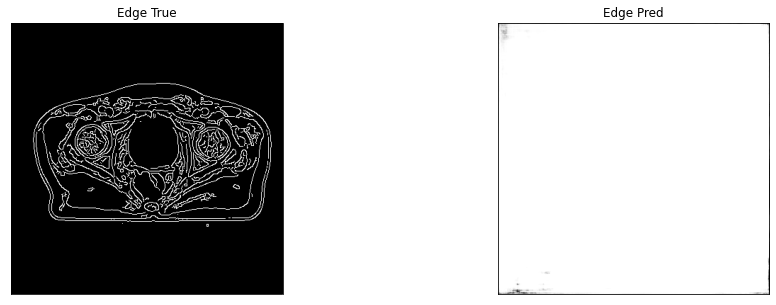

edge of ct_pred = 0.6872820854187012, edge of ct_true = 0.7166118621826172
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


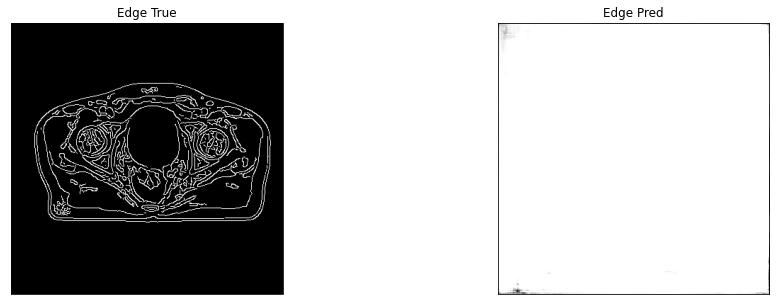

edge of ct_pred = 0.6873424053192139, edge of ct_true = 0.7169309258460999
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


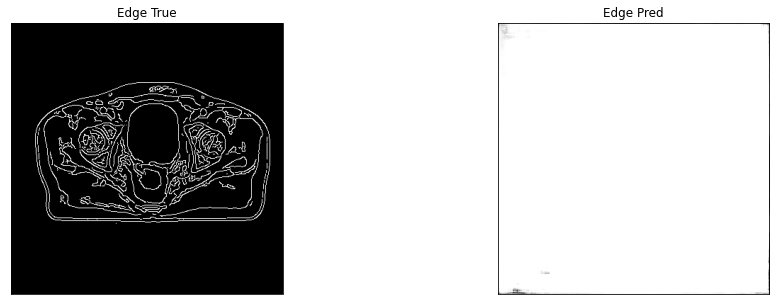

edge of ct_pred = 0.6872075200080872, edge of ct_true = 0.7169166803359985
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0041, device='cuda:0') tensor(1., device='cuda:0')


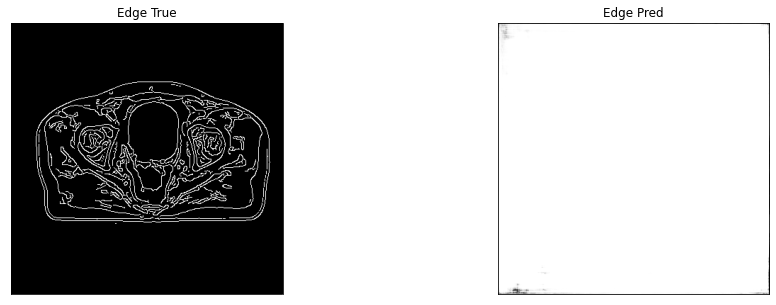

edge of ct_pred = 0.687254786491394, edge of ct_true = 0.7159162759780884
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


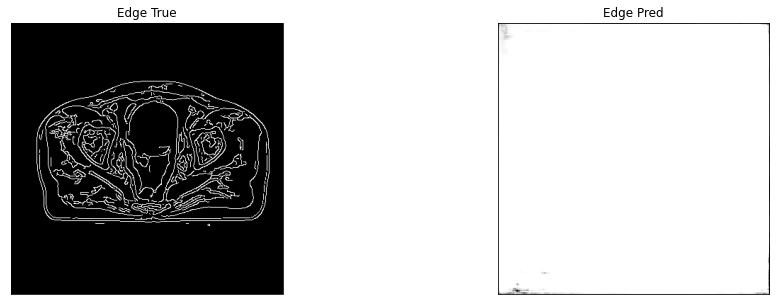

edge of ct_pred = 0.6873064637184143, edge of ct_true = 0.7153196930885315
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0012, device='cuda:0') tensor(1., device='cuda:0')


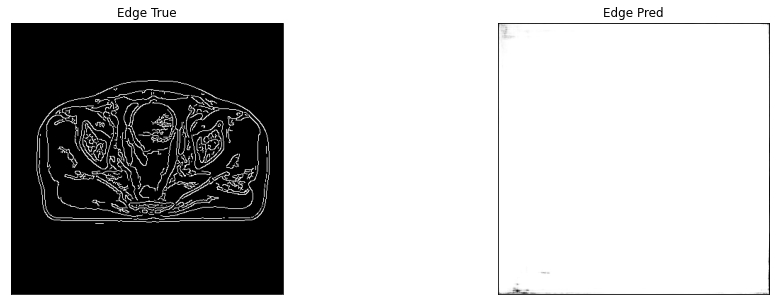

edge of ct_pred = 0.687289297580719, edge of ct_true = 0.7146349549293518
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


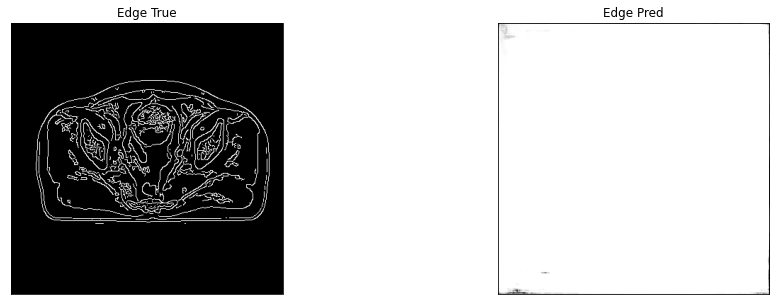

edge of ct_pred = 0.6873407363891602, edge of ct_true = 0.715308427810669
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


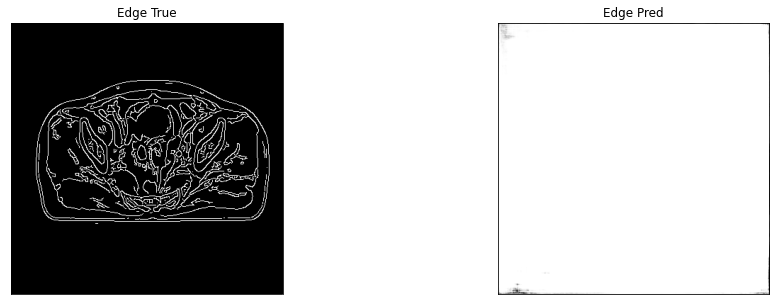

edge of ct_pred = 0.6873142123222351, edge of ct_true = 0.7139530181884766
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


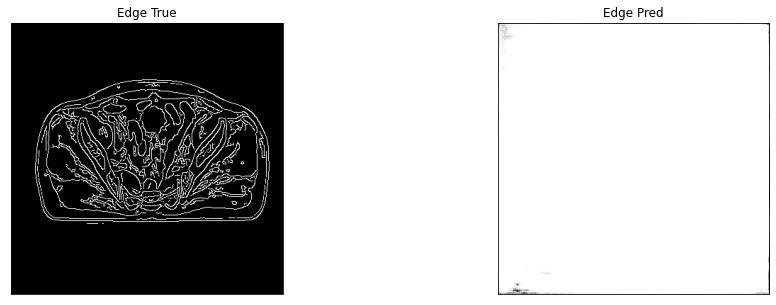

edge of ct_pred = 0.6872932314872742, edge of ct_true = 0.7144180536270142
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


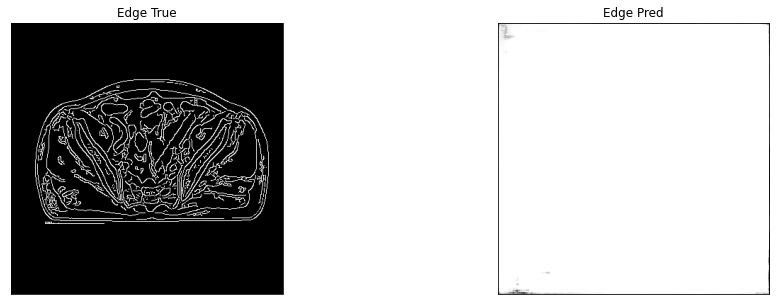

edge of ct_pred = 0.6874668598175049, edge of ct_true = 0.7133062481880188
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0038, device='cuda:0') tensor(1., device='cuda:0')


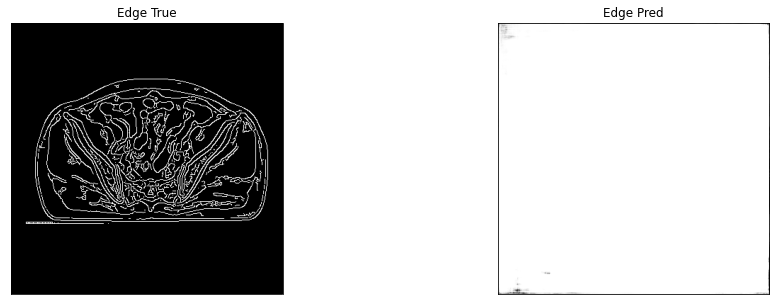

5it [00:12,  2.51s/it]

edge of ct_pred = 0.6872341632843018, edge of ct_true = 0.7133413553237915
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0008, device='cuda:0') tensor(1., device='cuda:0')


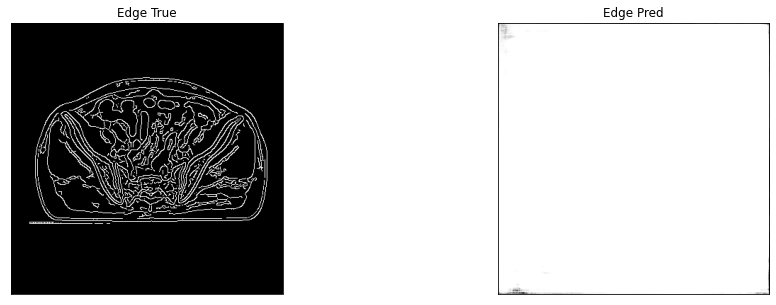

edge of ct_pred = 0.6874443888664246, edge of ct_true = 0.7077975273132324
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


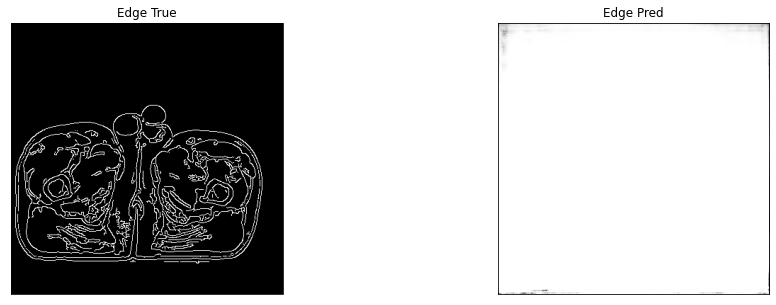

edge of ct_pred = 0.6872457265853882, edge of ct_true = 0.7075583338737488
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


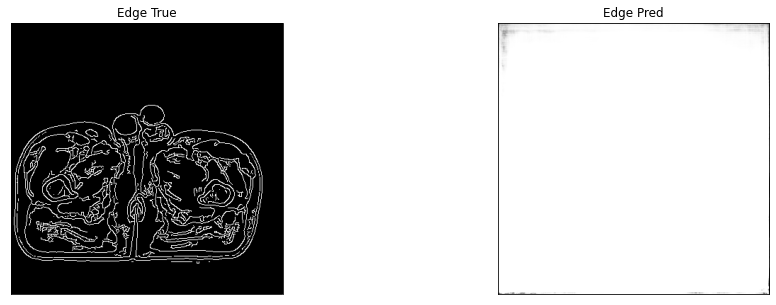

edge of ct_pred = 0.6872698068618774, edge of ct_true = 0.7086471915245056
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


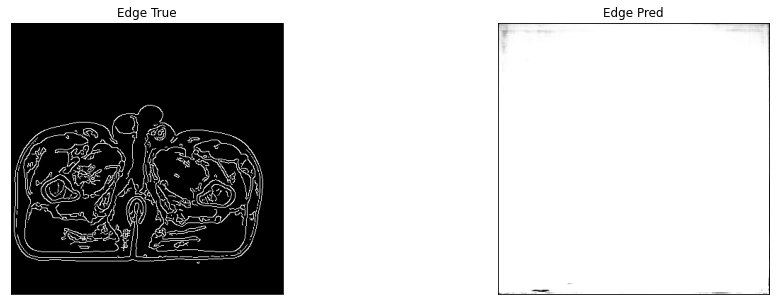

edge of ct_pred = 0.6872134208679199, edge of ct_true = 0.706993043422699
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


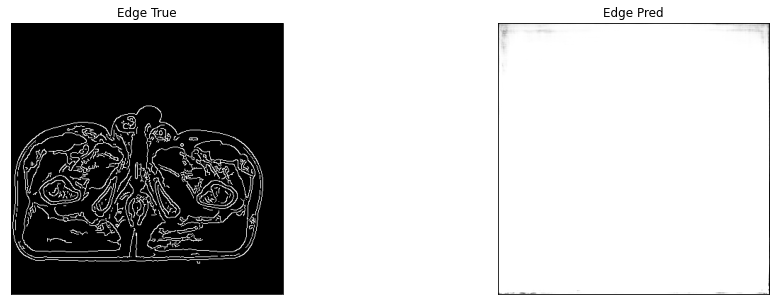

edge of ct_pred = 0.6873953342437744, edge of ct_true = 0.707599937915802
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


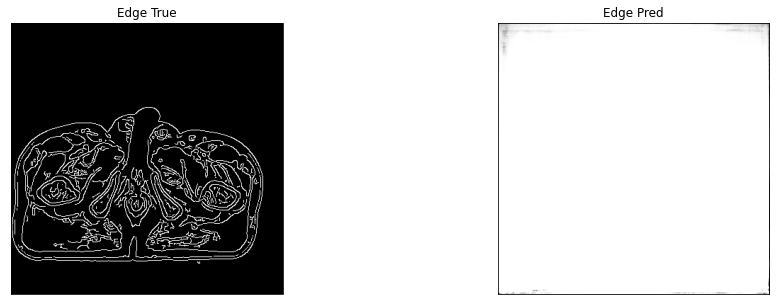

edge of ct_pred = 0.6875196099281311, edge of ct_true = 0.7060030698776245
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


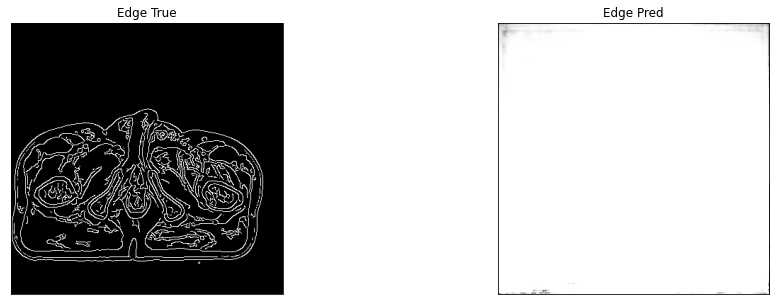

edge of ct_pred = 0.6871629953384399, edge of ct_true = 0.7077716588973999
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


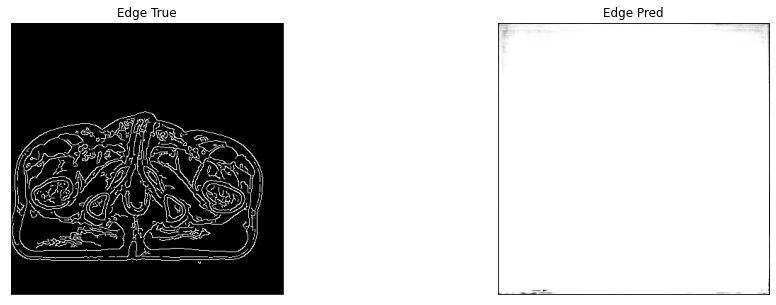

edge of ct_pred = 0.6872414350509644, edge of ct_true = 0.7079151272773743
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


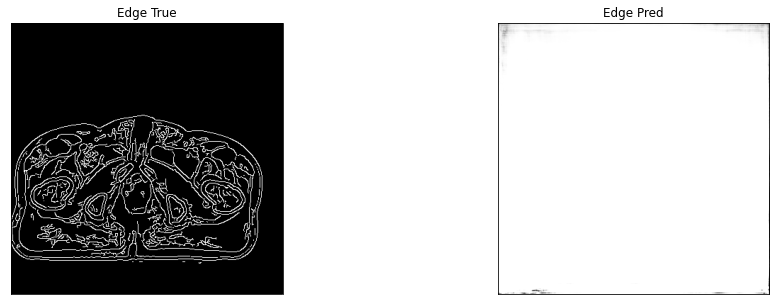

edge of ct_pred = 0.6871342658996582, edge of ct_true = 0.7075974941253662
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


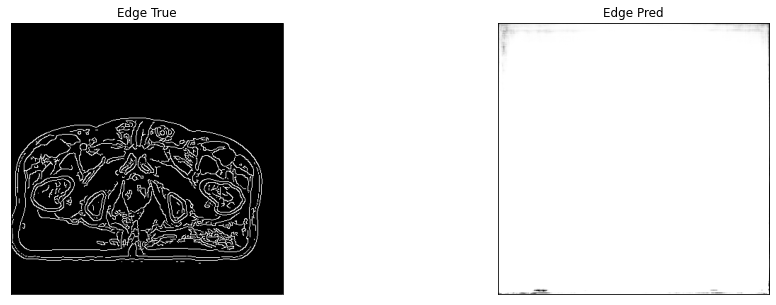

edge of ct_pred = 0.6871123313903809, edge of ct_true = 0.7091121673583984
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


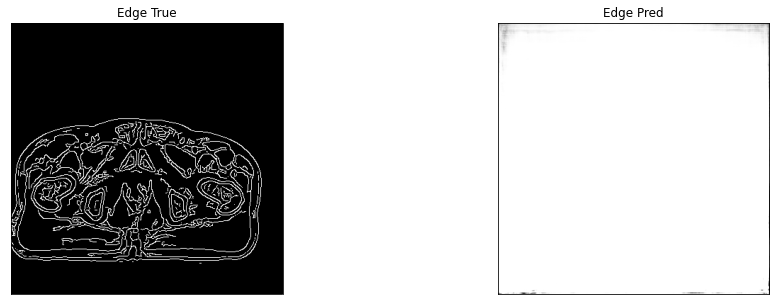

edge of ct_pred = 0.6871610283851624, edge of ct_true = 0.7069432735443115
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


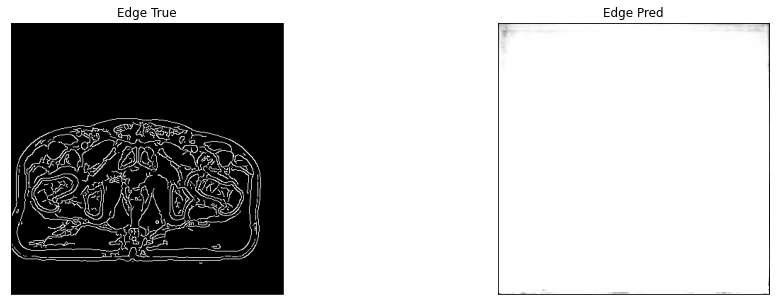

edge of ct_pred = 0.6869848370552063, edge of ct_true = 0.7065024375915527
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0008, device='cuda:0') tensor(1., device='cuda:0')


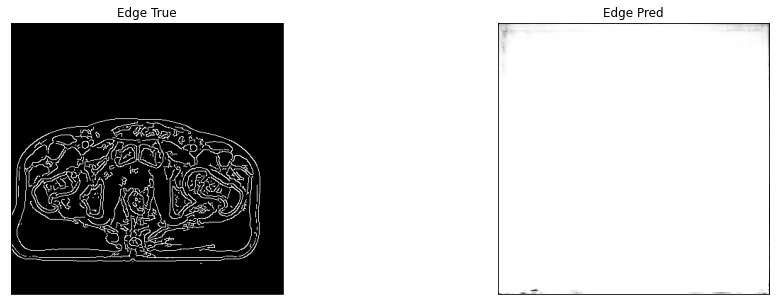

edge of ct_pred = 0.6872850656509399, edge of ct_true = 0.7066592574119568
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


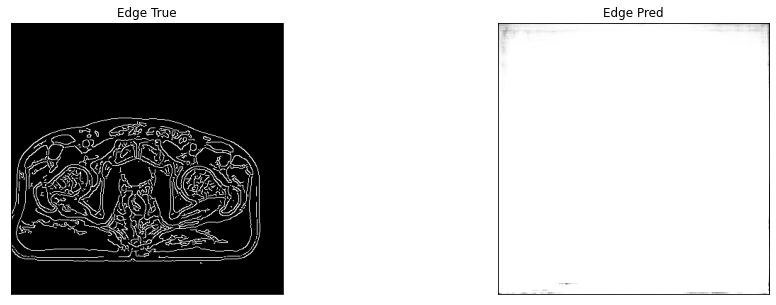

edge of ct_pred = 0.6873196959495544, edge of ct_true = 0.7072516083717346
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


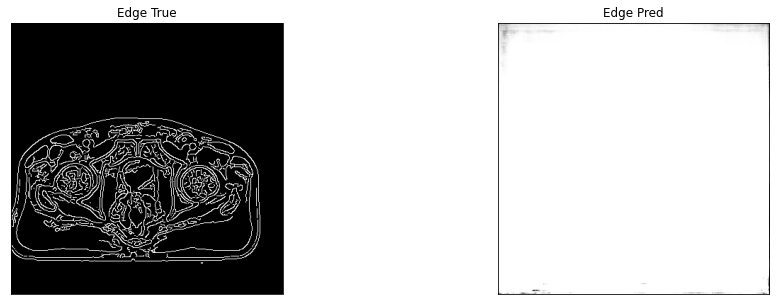

edge of ct_pred = 0.6870142817497253, edge of ct_true = 0.7059755325317383
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


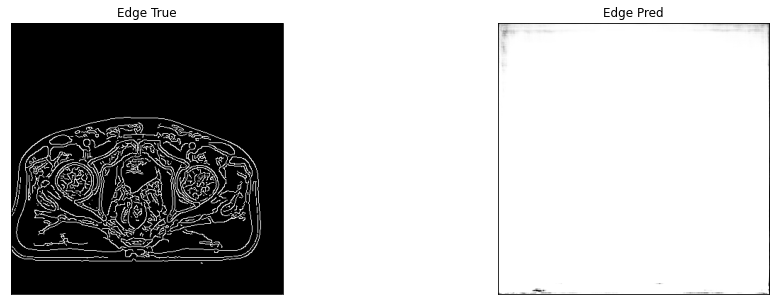

6it [00:14,  2.40s/it]

edge of ct_pred = 0.6870663166046143, edge of ct_true = 0.706083357334137
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


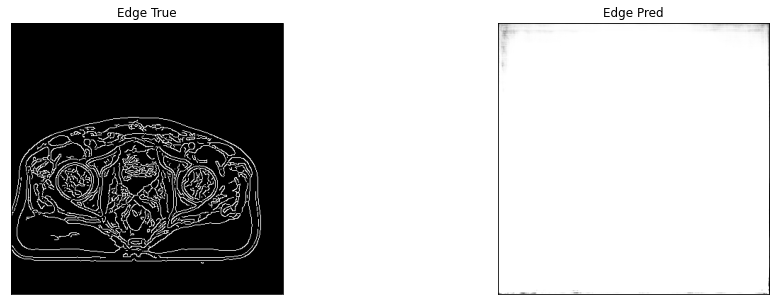

edge of ct_pred = 0.6871273517608643, edge of ct_true = 0.7083603143692017
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


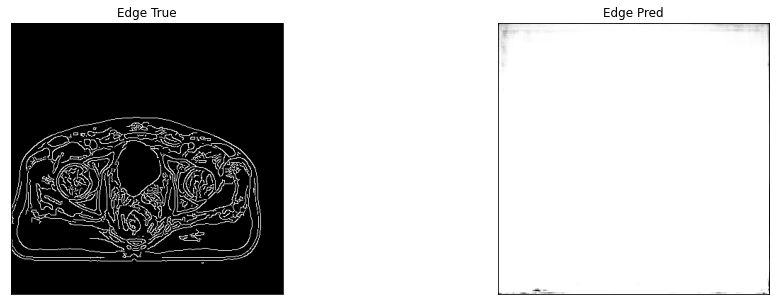

edge of ct_pred = 0.6872330904006958, edge of ct_true = 0.7066802978515625
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


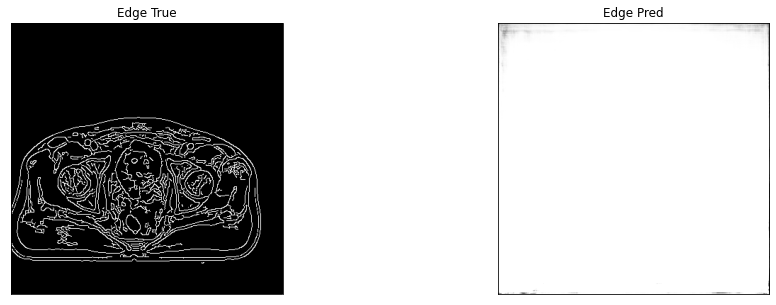

edge of ct_pred = 0.6872003674507141, edge of ct_true = 0.7085862159729004
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0007, device='cuda:0') tensor(1., device='cuda:0')


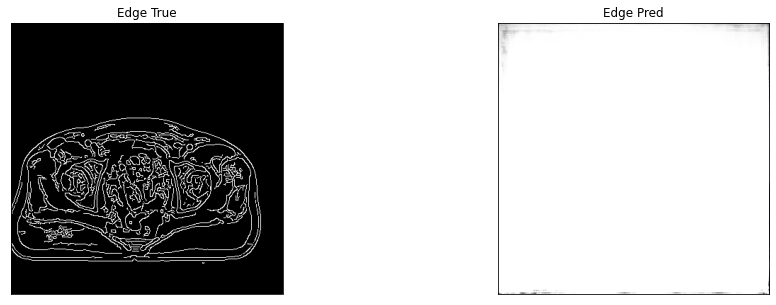

edge of ct_pred = 0.687119722366333, edge of ct_true = 0.7113834023475647
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


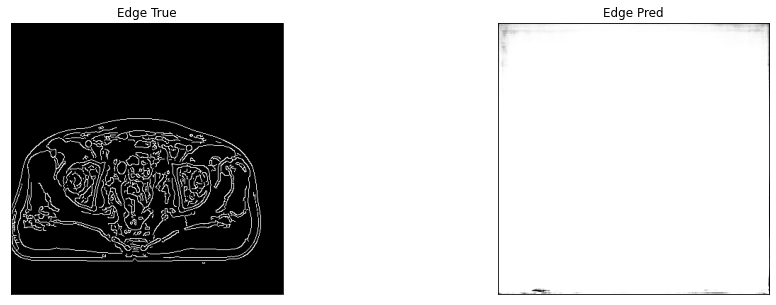

edge of ct_pred = 0.6871036291122437, edge of ct_true = 0.7103934288024902
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


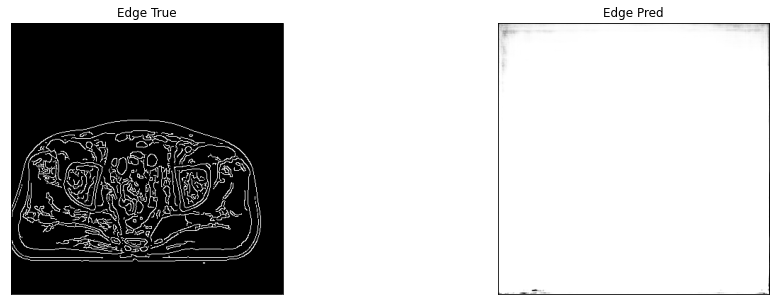

edge of ct_pred = 0.687080442905426, edge of ct_true = 0.7102880477905273
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


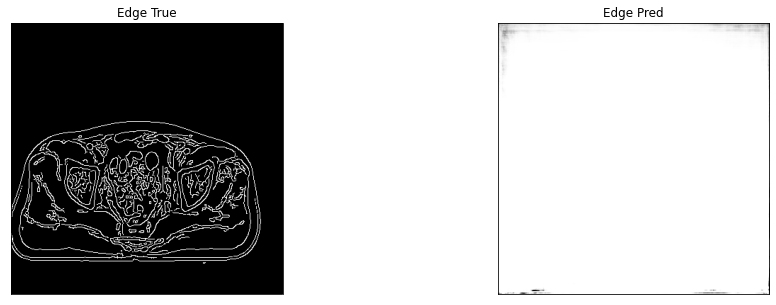

edge of ct_pred = 0.6871111989021301, edge of ct_true = 0.711944043636322
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


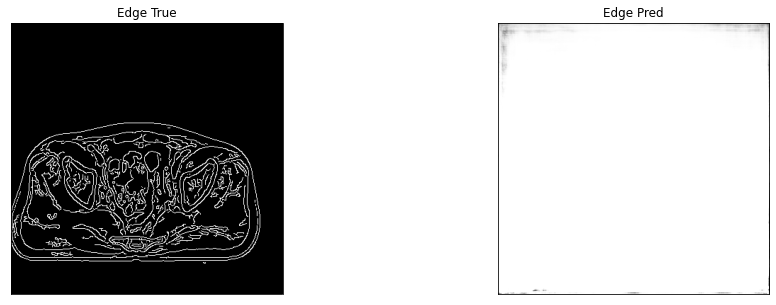

edge of ct_pred = 0.6870444416999817, edge of ct_true = 0.7112401723861694
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


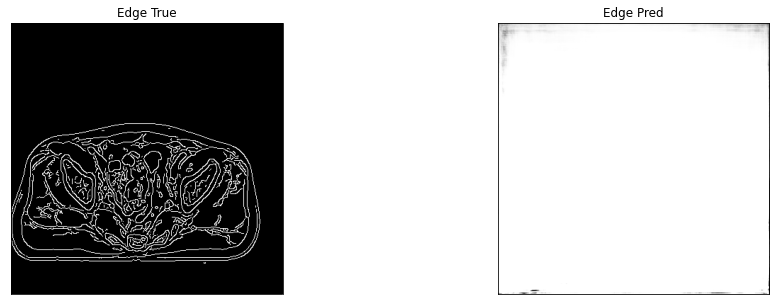

edge of ct_pred = 0.6872077584266663, edge of ct_true = 0.7111108303070068
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


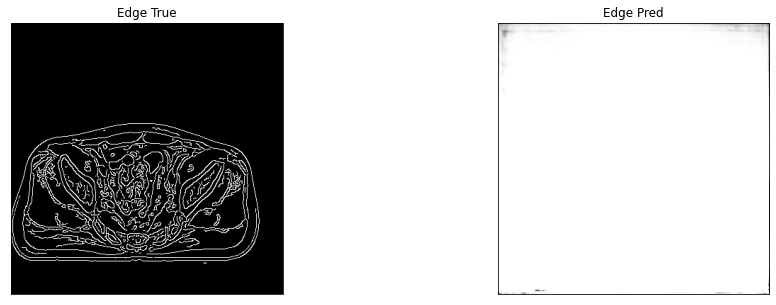

edge of ct_pred = 0.6872546076774597, edge of ct_true = 0.7119054198265076
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


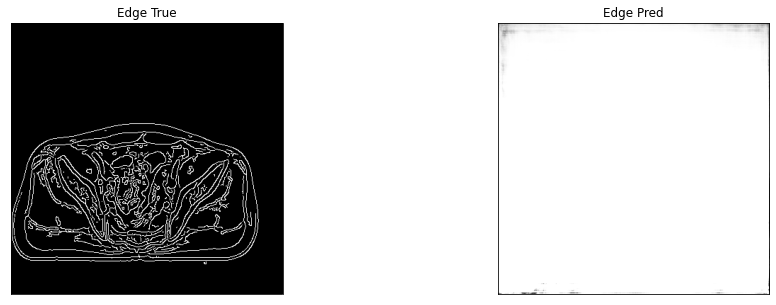

edge of ct_pred = 0.6873963475227356, edge of ct_true = 0.7112314105033875
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0001, device='cuda:0') tensor(1., device='cuda:0')


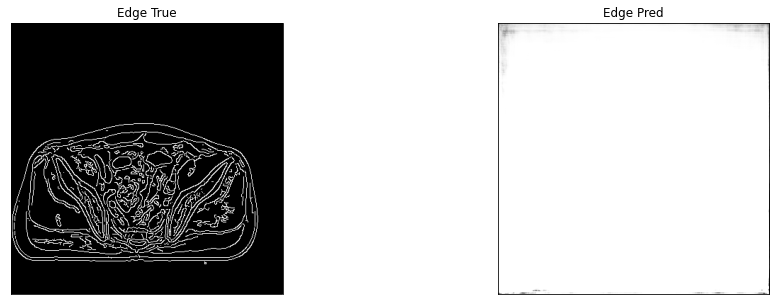

edge of ct_pred = 0.6874953508377075, edge of ct_true = 0.7133129835128784
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.0454e-05, device='cuda:0') tensor(1., device='cuda:0')


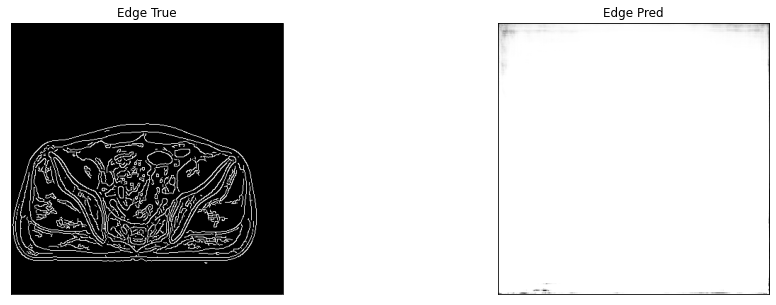

edge of ct_pred = 0.6875422596931458, edge of ct_true = 0.6972212195396423
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0012, device='cuda:0') tensor(1., device='cuda:0')


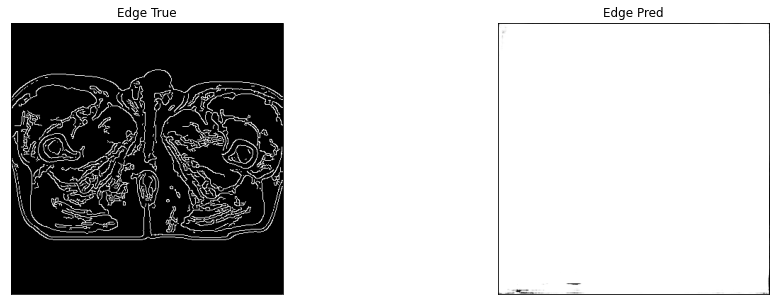

edge of ct_pred = 0.6875972151756287, edge of ct_true = 0.6945238709449768
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0026, device='cuda:0') tensor(1., device='cuda:0')


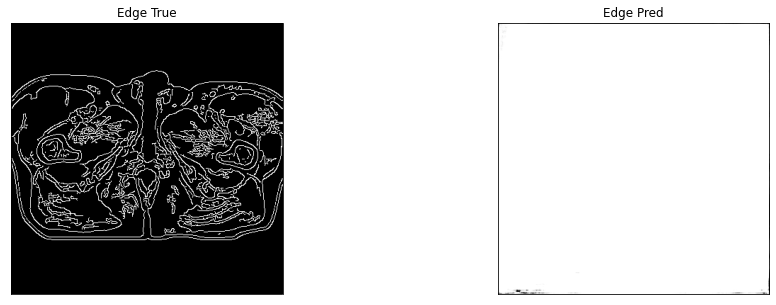

edge of ct_pred = 0.6877079606056213, edge of ct_true = 0.6985765695571899
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0034, device='cuda:0') tensor(1., device='cuda:0')


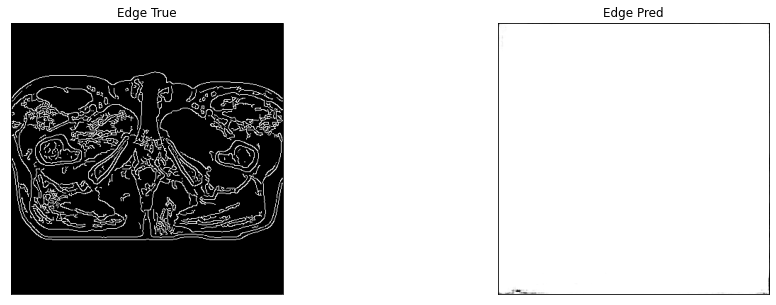

7it [00:16,  2.38s/it]

edge of ct_pred = 0.6877340078353882, edge of ct_true = 0.697718620300293
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


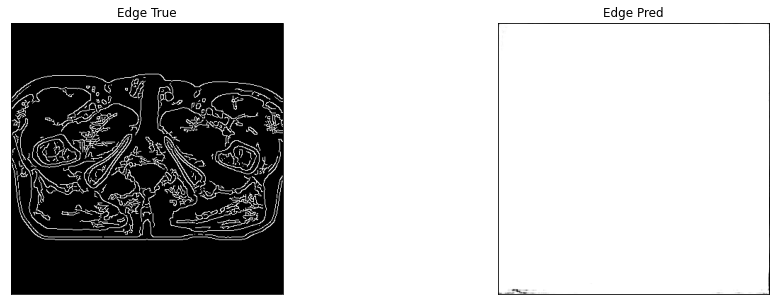

edge of ct_pred = 0.6877428293228149, edge of ct_true = 0.6983756422996521
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0012, device='cuda:0') tensor(1., device='cuda:0')


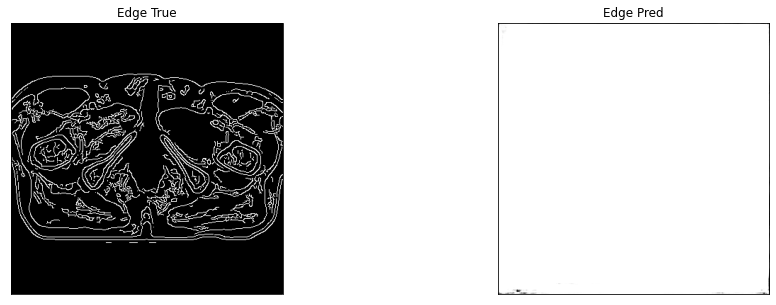

edge of ct_pred = 0.6876593232154846, edge of ct_true = 0.6976631283760071
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0024, device='cuda:0') tensor(1., device='cuda:0')


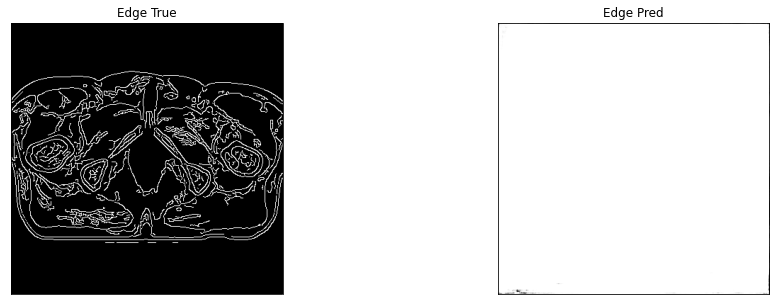

edge of ct_pred = 0.6875279545783997, edge of ct_true = 0.6967025399208069
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


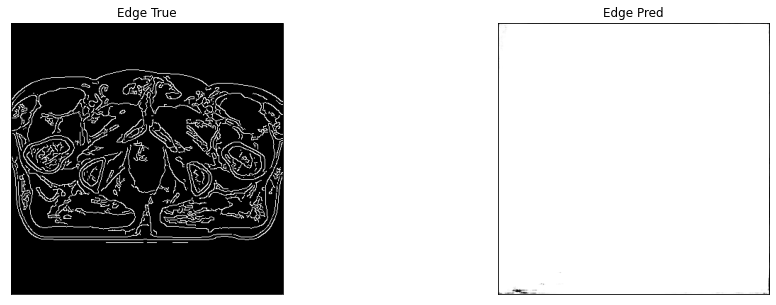

edge of ct_pred = 0.6875178813934326, edge of ct_true = 0.6941816210746765
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0017, device='cuda:0') tensor(1., device='cuda:0')


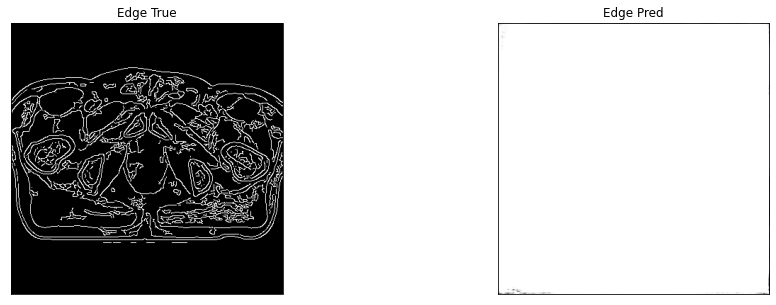

edge of ct_pred = 0.6877233982086182, edge of ct_true = 0.6978176832199097
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0017, device='cuda:0') tensor(1., device='cuda:0')


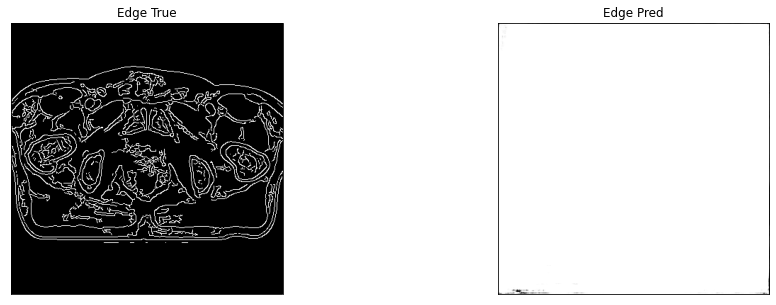

edge of ct_pred = 0.6874786615371704, edge of ct_true = 0.6955925226211548
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


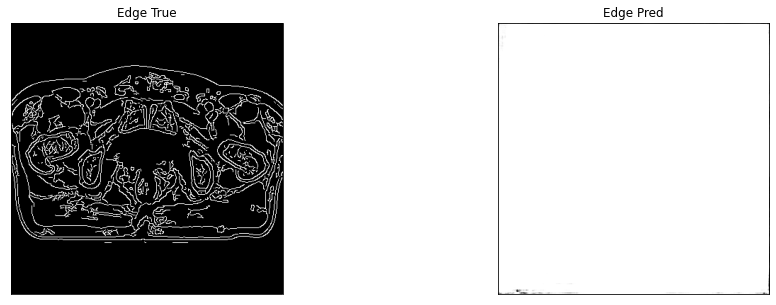

edge of ct_pred = 0.68759685754776, edge of ct_true = 0.6916416883468628
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0029, device='cuda:0') tensor(1., device='cuda:0')


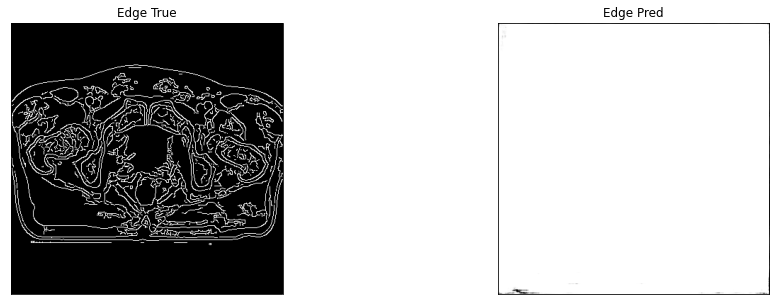

edge of ct_pred = 0.6876378059387207, edge of ct_true = 0.6884721517562866
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0022, device='cuda:0') tensor(1., device='cuda:0')


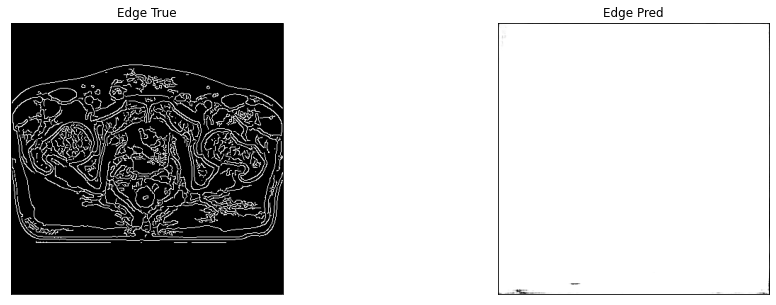

edge of ct_pred = 0.6876187920570374, edge of ct_true = 0.6942833662033081
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


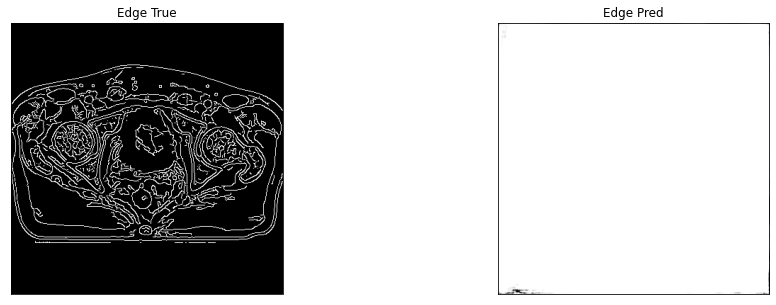

edge of ct_pred = 0.6875237822532654, edge of ct_true = 0.6908268332481384
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0031, device='cuda:0') tensor(1., device='cuda:0')


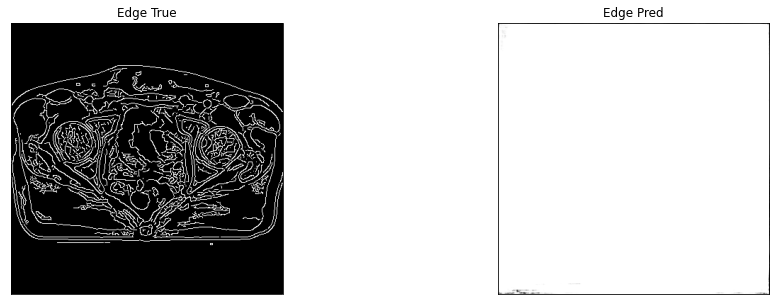

edge of ct_pred = 0.6875787973403931, edge of ct_true = 0.6929661631584167
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


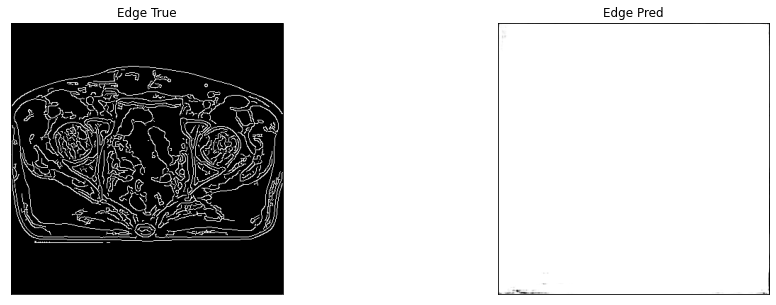

edge of ct_pred = 0.6876400113105774, edge of ct_true = 0.6925139427185059
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0017, device='cuda:0') tensor(1., device='cuda:0')


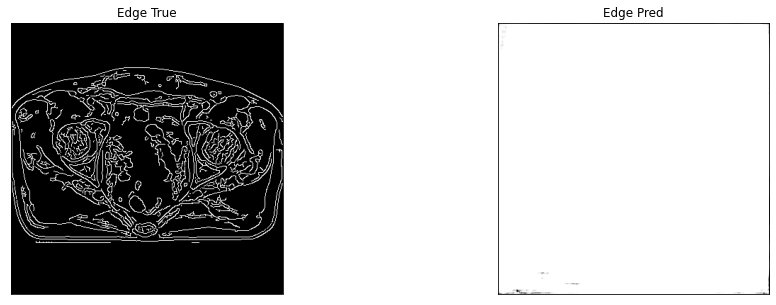

edge of ct_pred = 0.6875278949737549, edge of ct_true = 0.6946378350257874
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


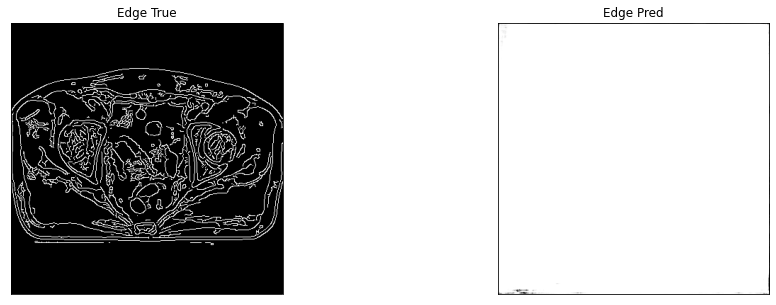

edge of ct_pred = 0.6875896453857422, edge of ct_true = 0.694580078125
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


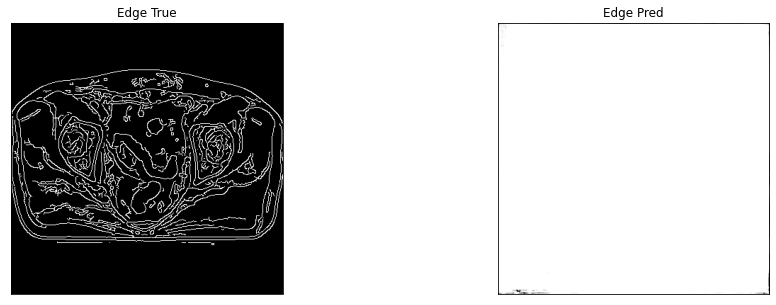

edge of ct_pred = 0.6874576807022095, edge of ct_true = 0.6936271786689758
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


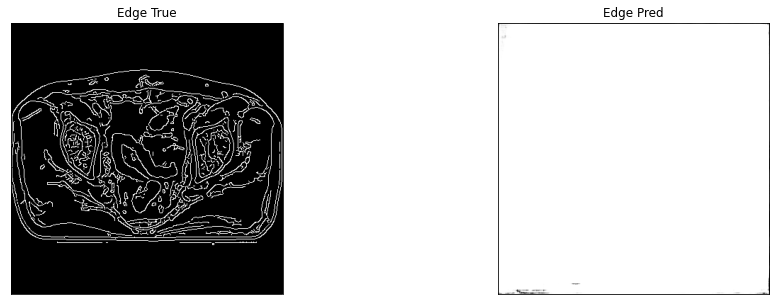

8it [00:19,  2.35s/it]

edge of ct_pred = 0.6875597238540649, edge of ct_true = 0.6946423649787903
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0018, device='cuda:0') tensor(1., device='cuda:0')


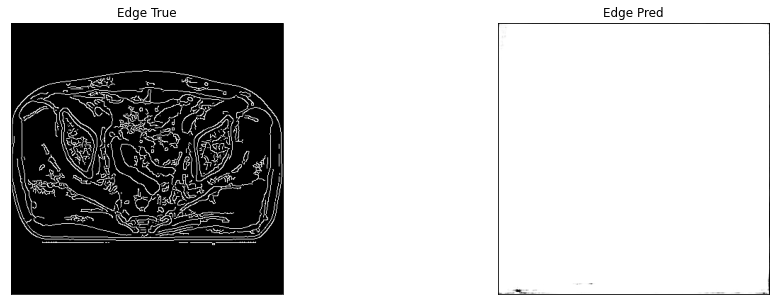

edge of ct_pred = 0.687556266784668, edge of ct_true = 0.6950824856758118
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


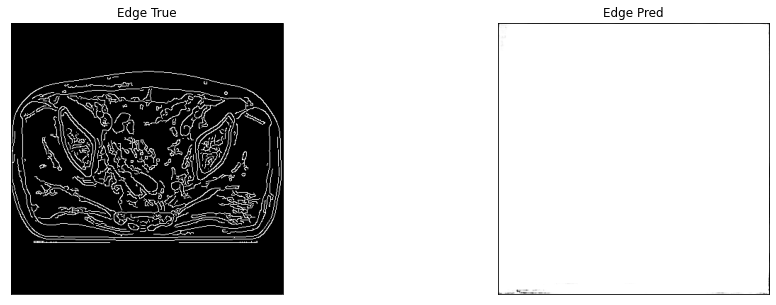

edge of ct_pred = 0.6876233816146851, edge of ct_true = 0.6966550946235657
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0043, device='cuda:0') tensor(1., device='cuda:0')


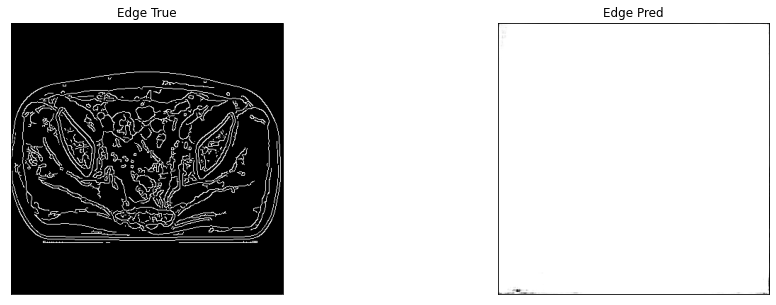

edge of ct_pred = 0.6875939965248108, edge of ct_true = 0.6967321038246155
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


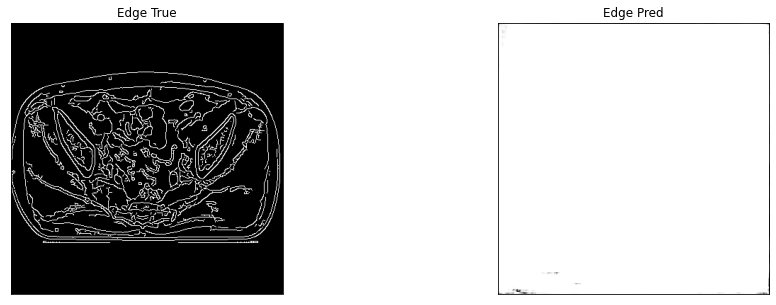

edge of ct_pred = 0.6875355839729309, edge of ct_true = 0.6961578130722046
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0049, device='cuda:0') tensor(1., device='cuda:0')


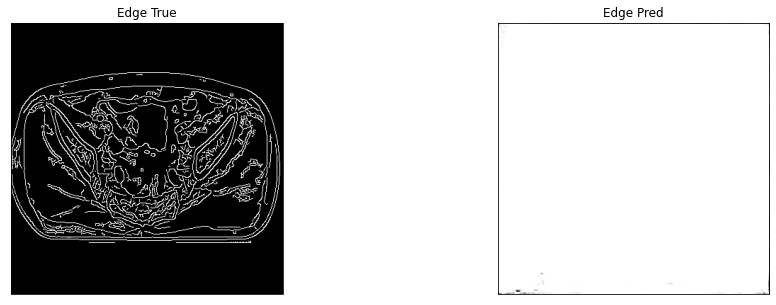

edge of ct_pred = 0.6874938607215881, edge of ct_true = 0.6956151127815247
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


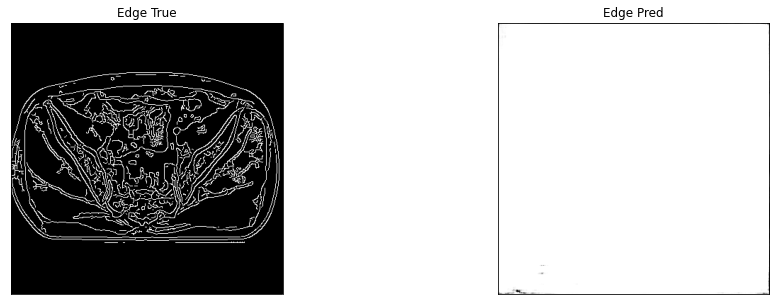

edge of ct_pred = 0.6876056790351868, edge of ct_true = 0.6953960061073303
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0063, device='cuda:0') tensor(1., device='cuda:0')


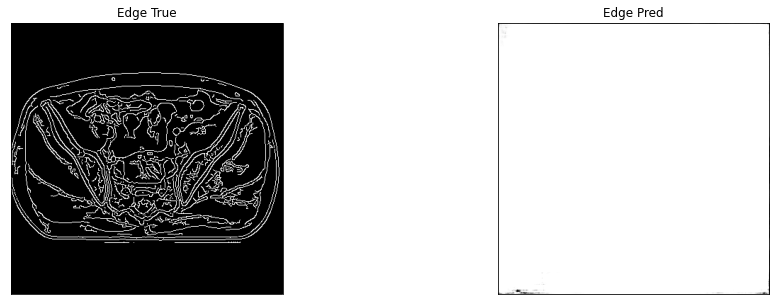

edge of ct_pred = 0.6874476075172424, edge of ct_true = 0.6982272267341614
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


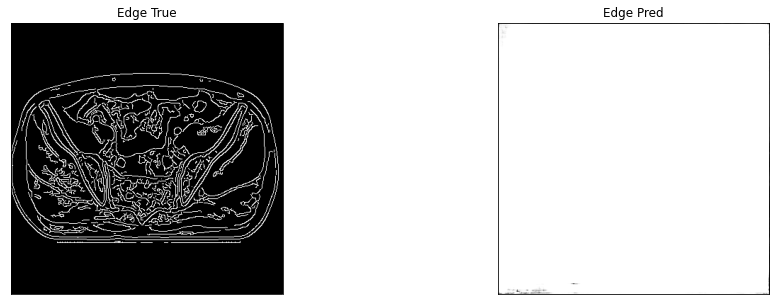

edge of ct_pred = 0.6875796318054199, edge of ct_true = 0.7069107890129089
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


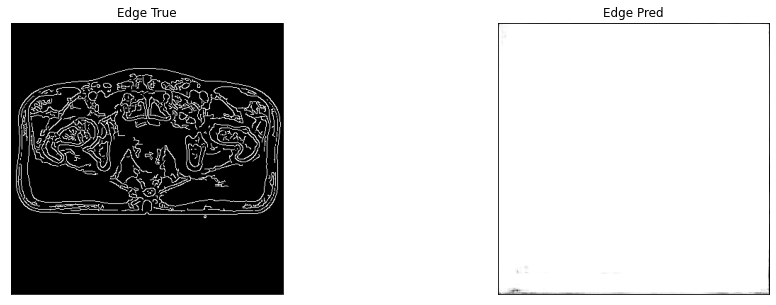

edge of ct_pred = 0.687606692314148, edge of ct_true = 0.707101047039032
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


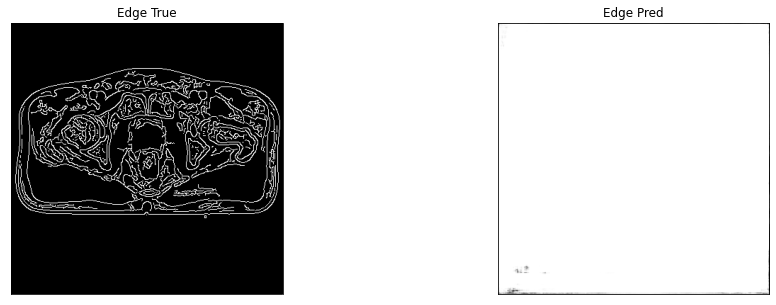

edge of ct_pred = 0.6875282526016235, edge of ct_true = 0.7076880931854248
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


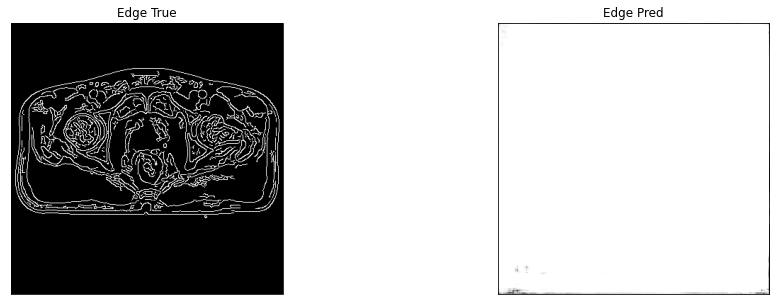

edge of ct_pred = 0.6875925064086914, edge of ct_true = 0.7075234055519104
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0081, device='cuda:0') tensor(1., device='cuda:0')


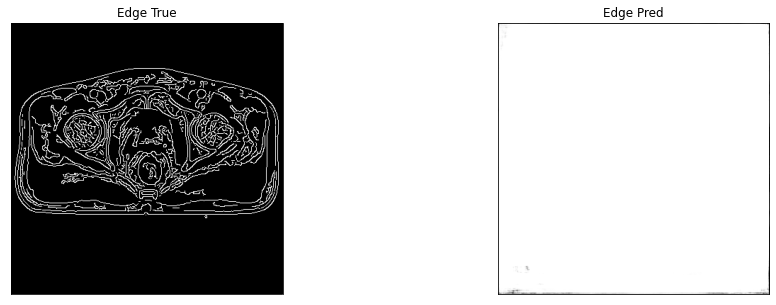

edge of ct_pred = 0.6875166296958923, edge of ct_true = 0.7082154154777527
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


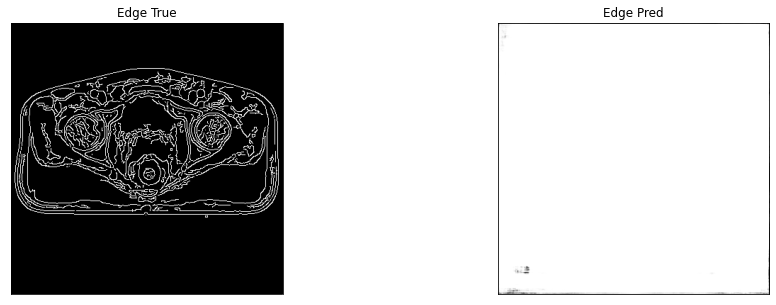

edge of ct_pred = 0.6876055002212524, edge of ct_true = 0.7109893560409546
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0006, device='cuda:0') tensor(1., device='cuda:0')


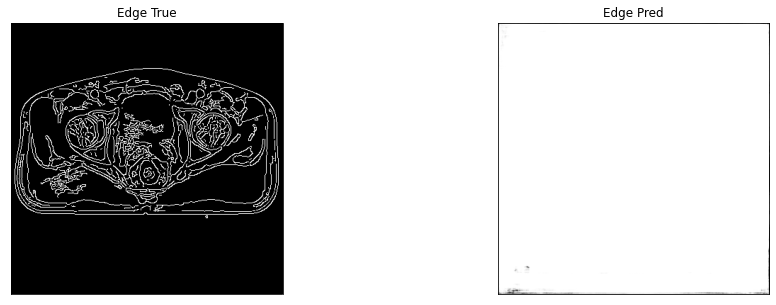

edge of ct_pred = 0.6874492764472961, edge of ct_true = 0.7095344662666321
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0018, device='cuda:0') tensor(1., device='cuda:0')


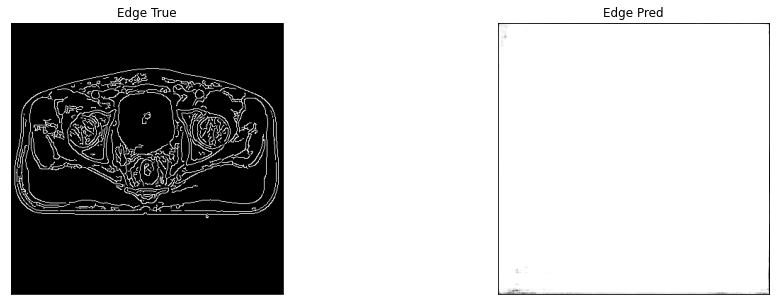

edge of ct_pred = 0.6875978112220764, edge of ct_true = 0.7093170881271362
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


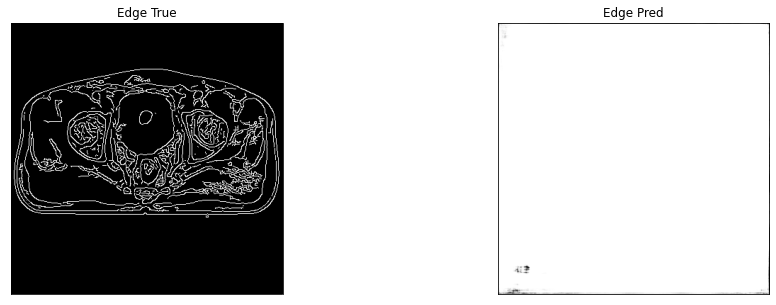

9it [00:21,  2.30s/it]

edge of ct_pred = 0.6874563694000244, edge of ct_true = 0.7106475830078125
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0016, device='cuda:0') tensor(1., device='cuda:0')


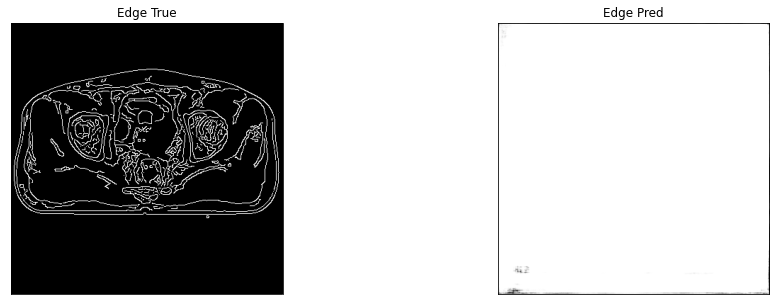

edge of ct_pred = 0.6875380277633667, edge of ct_true = 0.7087700366973877
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


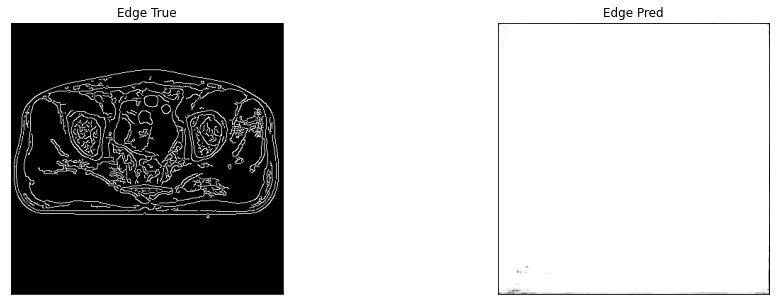

edge of ct_pred = 0.6875966787338257, edge of ct_true = 0.7093060612678528
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


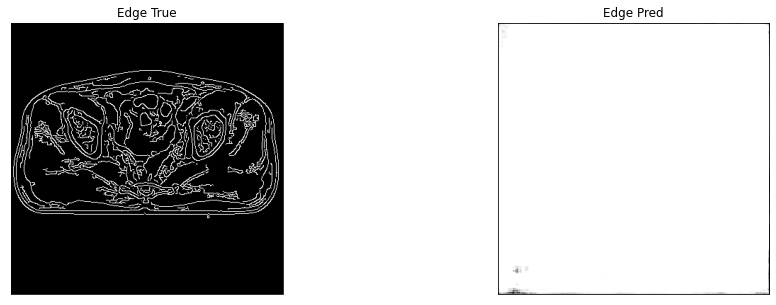

edge of ct_pred = 0.6875525712966919, edge of ct_true = 0.7106266021728516
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.8366e-05, device='cuda:0') tensor(1., device='cuda:0')


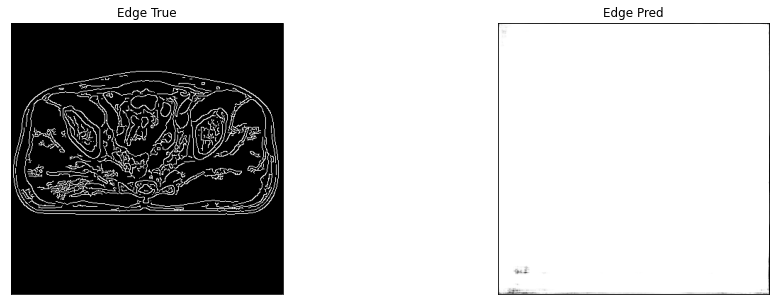

edge of ct_pred = 0.6875276565551758, edge of ct_true = 0.7078795433044434
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0009, device='cuda:0') tensor(1., device='cuda:0')


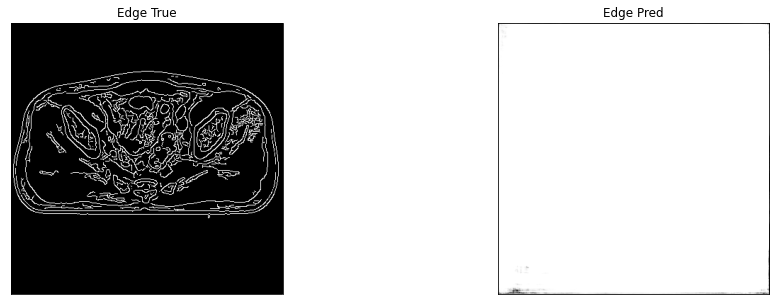

edge of ct_pred = 0.6875646710395813, edge of ct_true = 0.709102213382721
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


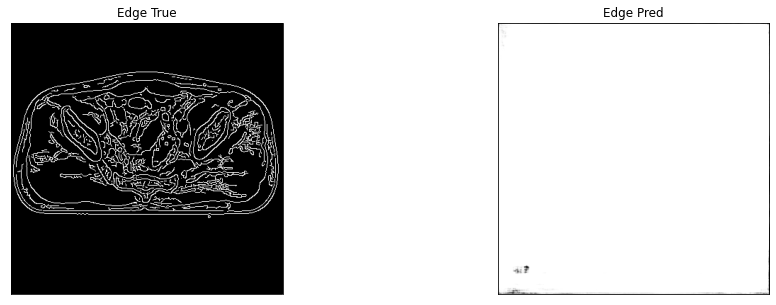

edge of ct_pred = 0.6875349283218384, edge of ct_true = 0.7093424797058105
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


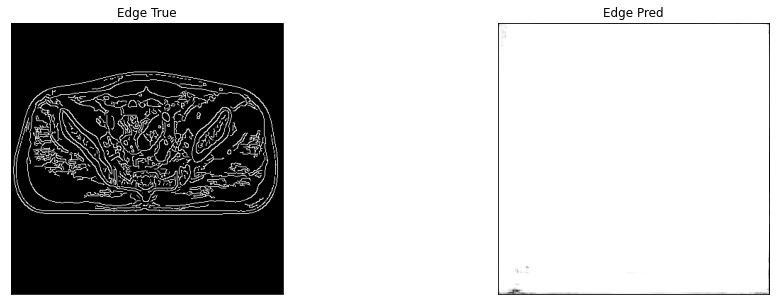

edge of ct_pred = 0.687612771987915, edge of ct_true = 0.7116003036499023
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0007, device='cuda:0') tensor(1., device='cuda:0')


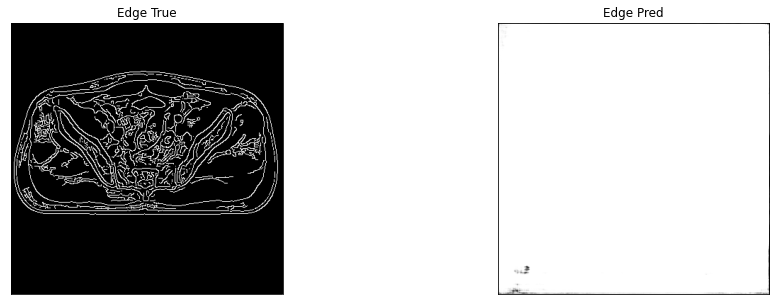

edge of ct_pred = 0.6874902844429016, edge of ct_true = 0.710005521774292
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0039, device='cuda:0') tensor(1., device='cuda:0')


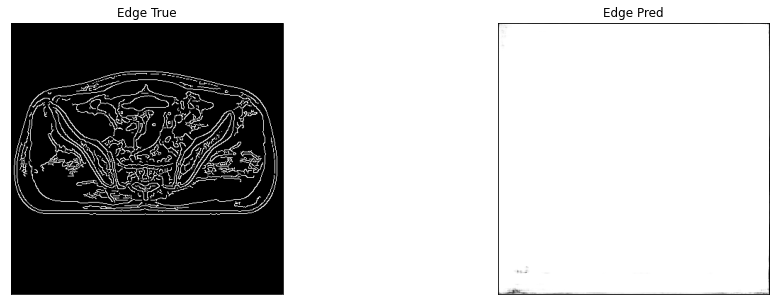

edge of ct_pred = 0.6875233054161072, edge of ct_true = 0.709404468536377
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0003, device='cuda:0') tensor(1., device='cuda:0')


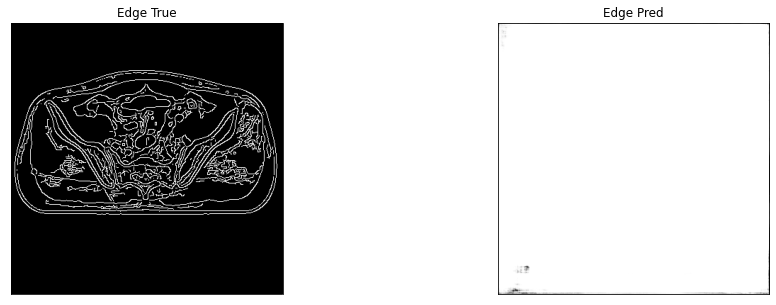

edge of ct_pred = 0.6875943541526794, edge of ct_true = 0.7106490135192871
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


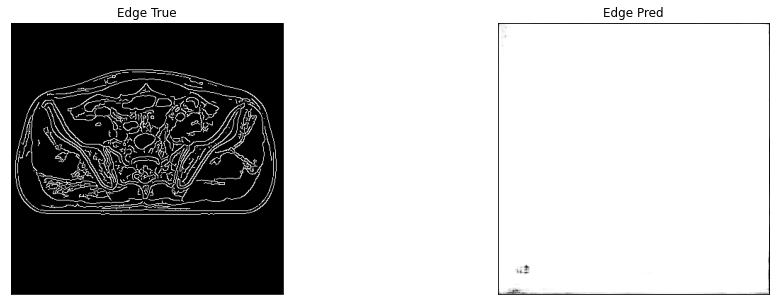

edge of ct_pred = 0.6876219511032104, edge of ct_true = 0.7091243863105774
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


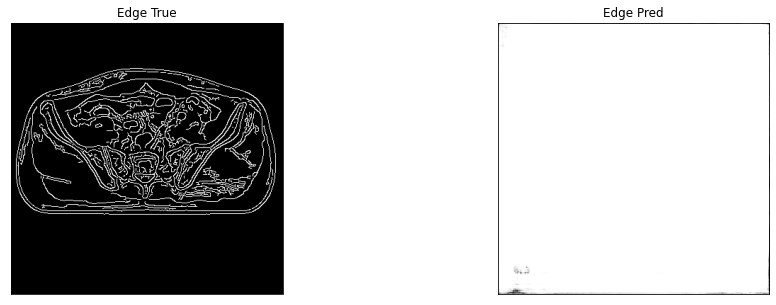

edge of ct_pred = 0.687493085861206, edge of ct_true = 0.7107597589492798
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


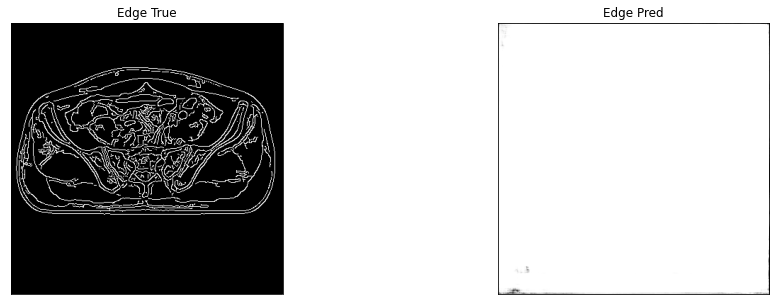

edge of ct_pred = 0.6875412464141846, edge of ct_true = 0.7099825739860535
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


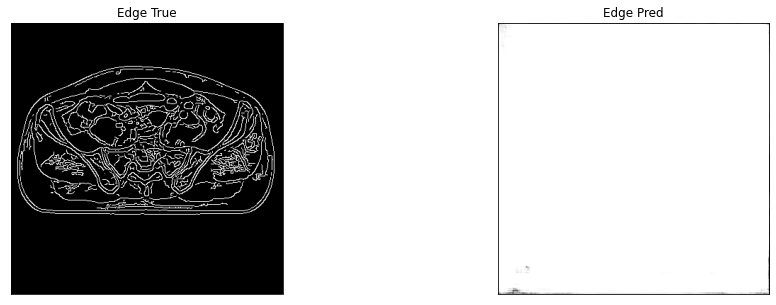

edge of ct_pred = 0.6877034306526184, edge of ct_true = 0.7098308205604553
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0008, device='cuda:0') tensor(1., device='cuda:0')


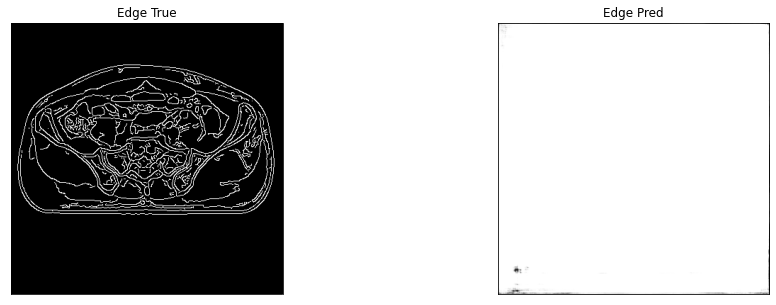

edge of ct_pred = 0.6875605583190918, edge of ct_true = 0.7093461155891418
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0004, device='cuda:0') tensor(1., device='cuda:0')


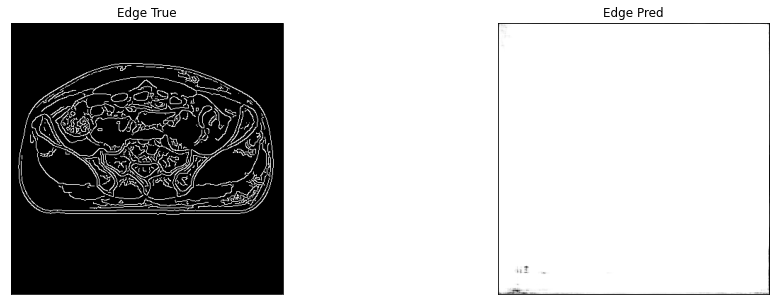

10it [00:23,  2.30s/it]

edge of ct_pred = 0.6877583265304565, edge of ct_true = 0.7087939381599426
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


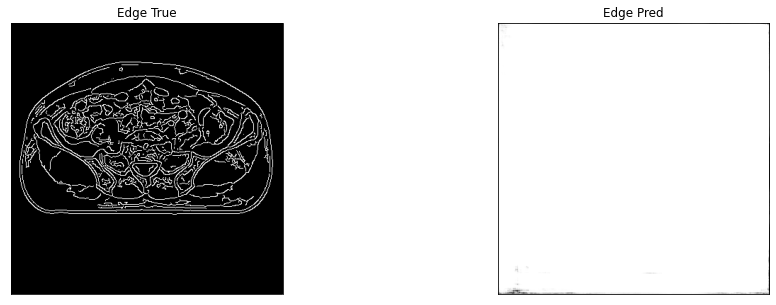

edge of ct_pred = 0.6876241564750671, edge of ct_true = 0.7098647356033325
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


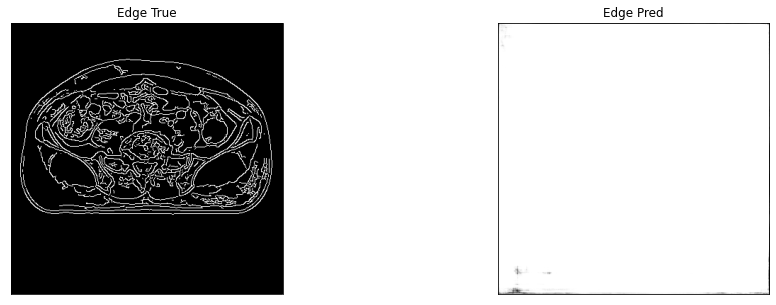

edge of ct_pred = 0.6876192092895508, edge of ct_true = 0.7101783752441406
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


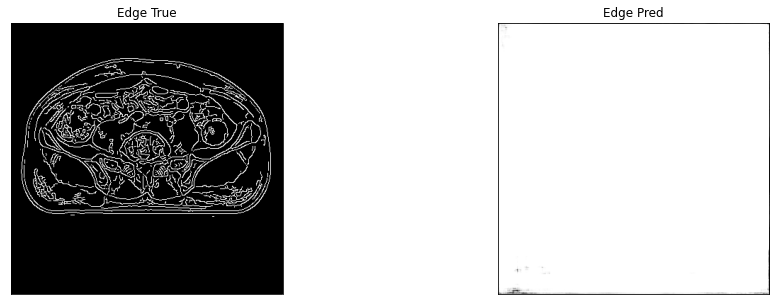

edge of ct_pred = 0.6875183582305908, edge of ct_true = 0.7102637887001038
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0048, device='cuda:0') tensor(1., device='cuda:0')


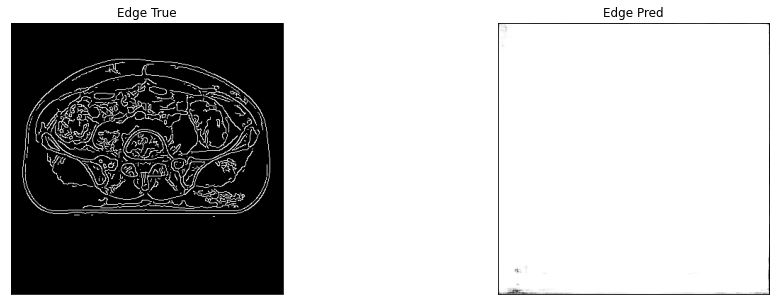

edge of ct_pred = 0.6873661875724792, edge of ct_true = 0.7076987624168396
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


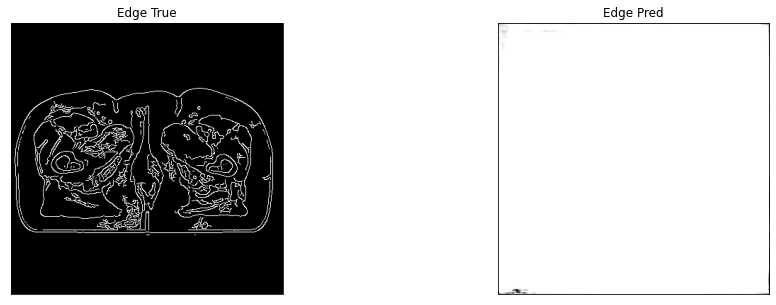

edge of ct_pred = 0.6874589920043945, edge of ct_true = 0.7050197124481201
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0041, device='cuda:0') tensor(1., device='cuda:0')


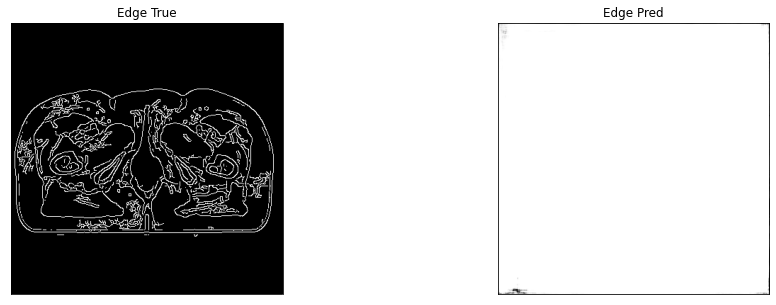

edge of ct_pred = 0.6874298453330994, edge of ct_true = 0.704518735408783
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


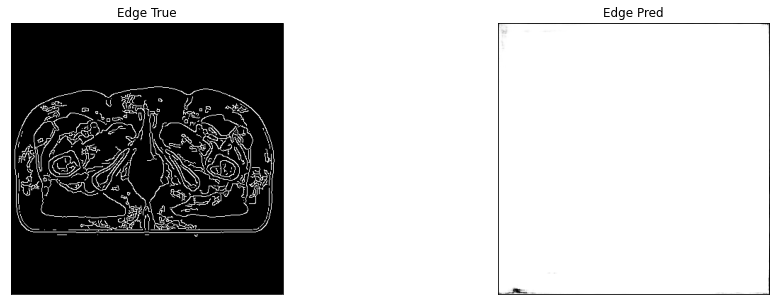

edge of ct_pred = 0.6873292922973633, edge of ct_true = 0.7050496935844421
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0023, device='cuda:0') tensor(1., device='cuda:0')


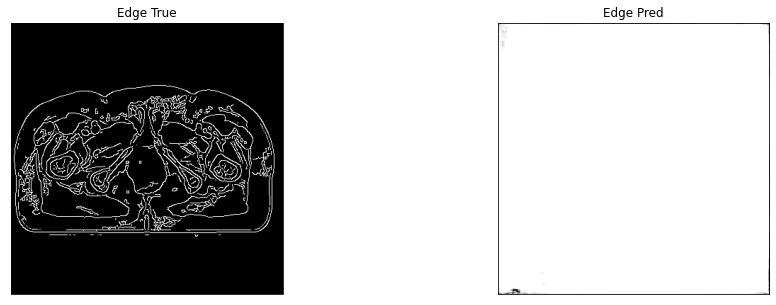

edge of ct_pred = 0.6874465346336365, edge of ct_true = 0.7006828784942627
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


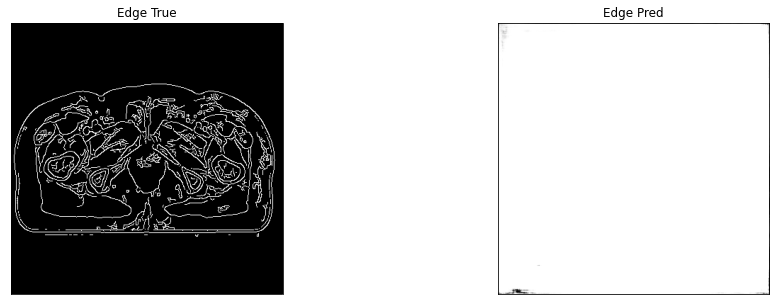

edge of ct_pred = 0.6874281167984009, edge of ct_true = 0.70411217212677
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


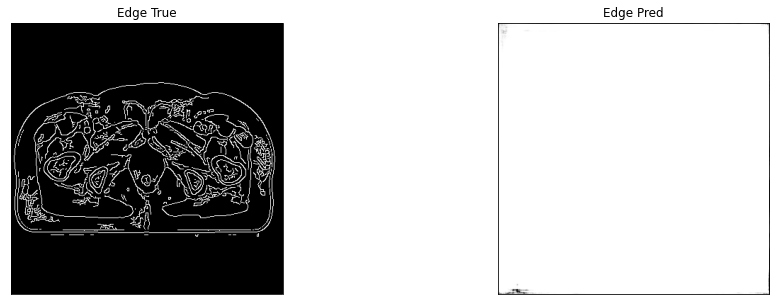

edge of ct_pred = 0.6873356103897095, edge of ct_true = 0.7039805054664612
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0022, device='cuda:0') tensor(1., device='cuda:0')


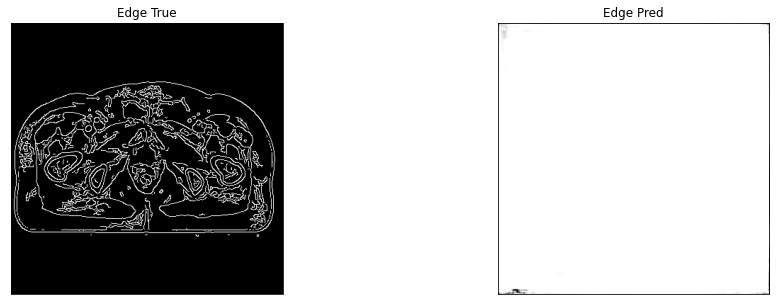

edge of ct_pred = 0.687421977519989, edge of ct_true = 0.7012704014778137
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


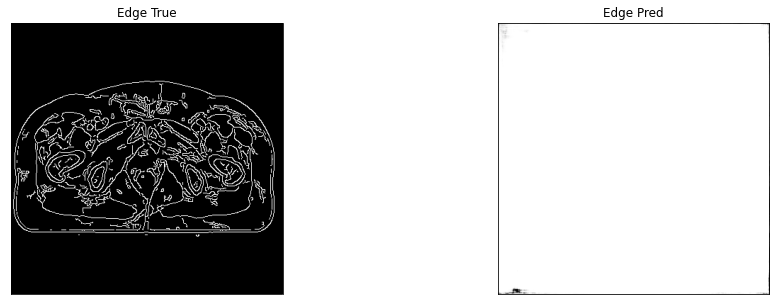

edge of ct_pred = 0.6872743964195251, edge of ct_true = 0.7022198438644409
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0050, device='cuda:0') tensor(1., device='cuda:0')


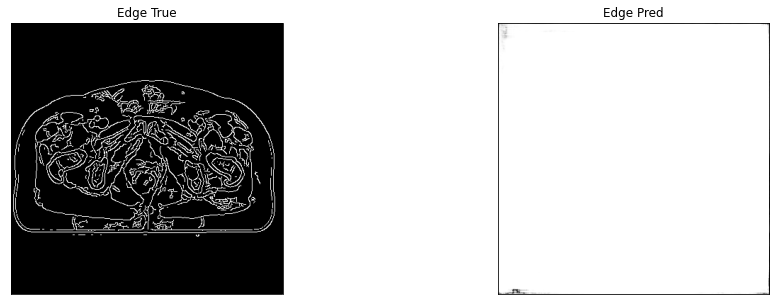

edge of ct_pred = 0.6873734593391418, edge of ct_true = 0.703822672367096
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


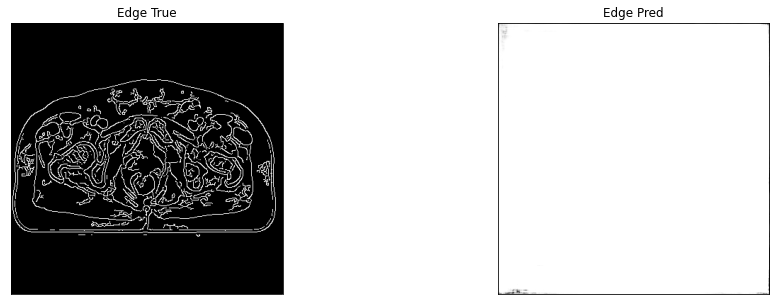

edge of ct_pred = 0.6873967051506042, edge of ct_true = 0.7003875374794006
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0022, device='cuda:0') tensor(1., device='cuda:0')


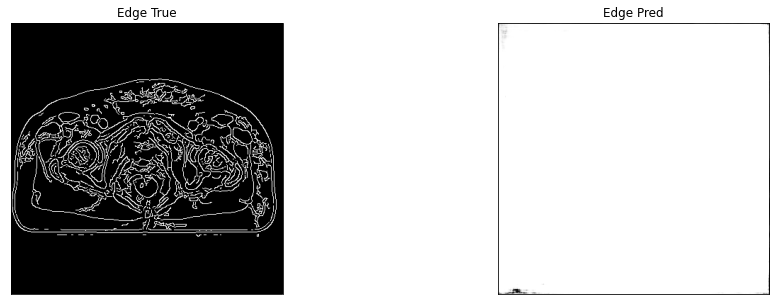

edge of ct_pred = 0.687358558177948, edge of ct_true = 0.7014762759208679
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


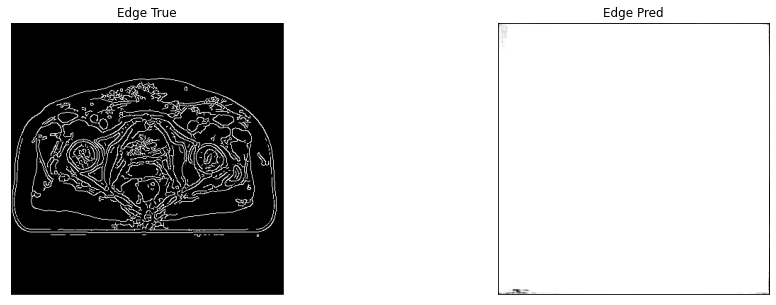

11it [00:25,  2.27s/it]

edge of ct_pred = 0.687294065952301, edge of ct_true = 0.7032917141914368
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


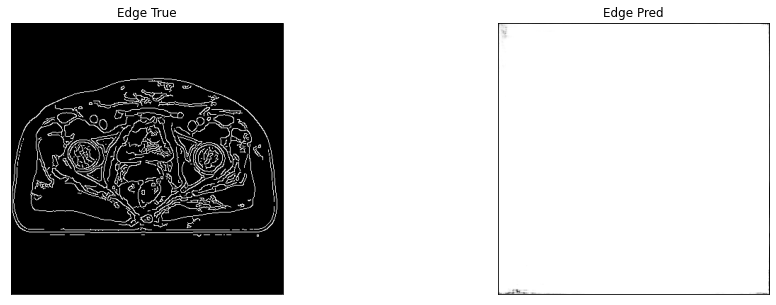

edge of ct_pred = 0.6873496174812317, edge of ct_true = 0.7051455974578857
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0006, device='cuda:0') tensor(1., device='cuda:0')


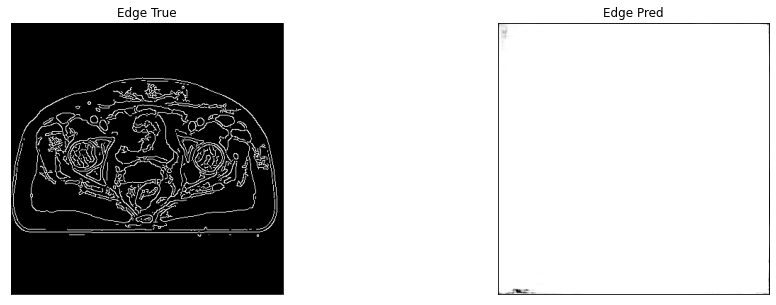

edge of ct_pred = 0.6873436570167542, edge of ct_true = 0.7045226693153381
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


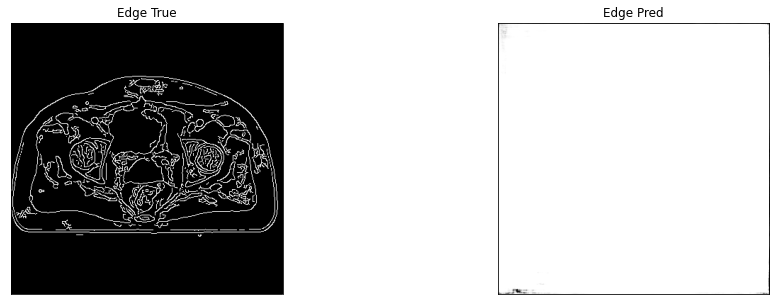

edge of ct_pred = 0.6873720288276672, edge of ct_true = 0.7060772776603699
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


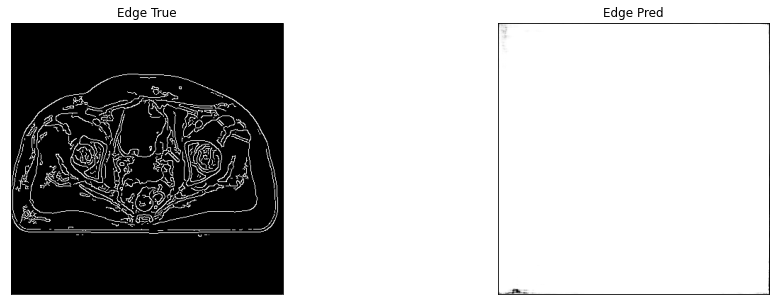

edge of ct_pred = 0.6874562501907349, edge of ct_true = 0.7041680216789246
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0019, device='cuda:0') tensor(1., device='cuda:0')


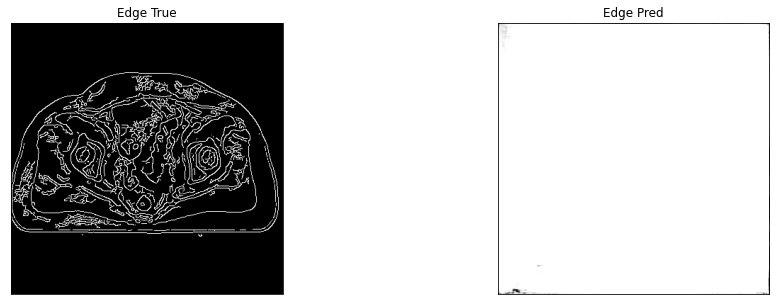

edge of ct_pred = 0.6874247193336487, edge of ct_true = 0.7057682871818542
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


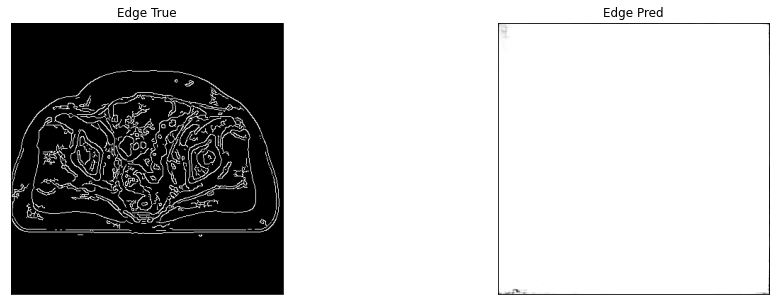

edge of ct_pred = 0.6874476671218872, edge of ct_true = 0.7061281800270081
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0002, device='cuda:0') tensor(1., device='cuda:0')


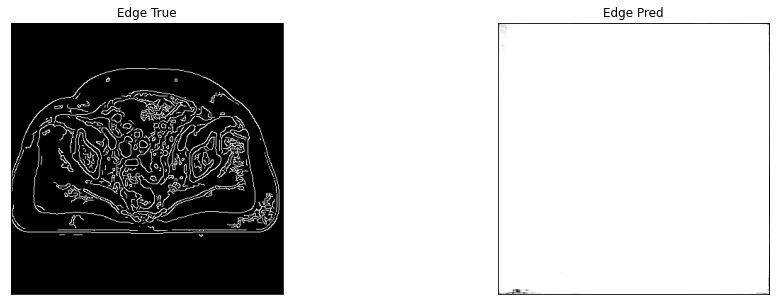

edge of ct_pred = 0.6874529123306274, edge of ct_true = 0.7030544281005859
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0008, device='cuda:0') tensor(1., device='cuda:0')


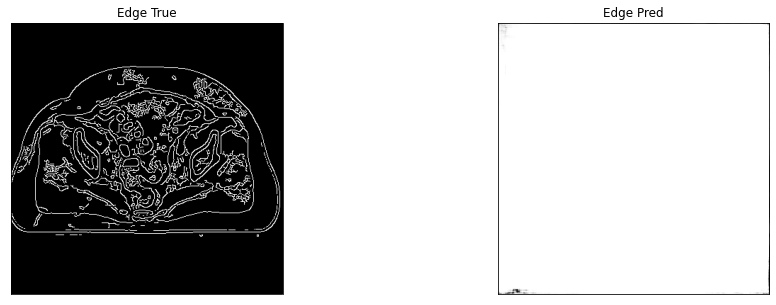

edge of ct_pred = 0.6875259280204773, edge of ct_true = 0.7065133452415466
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0006, device='cuda:0') tensor(1., device='cuda:0')


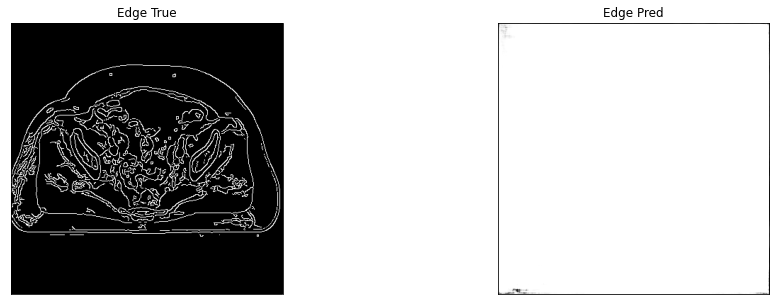

edge of ct_pred = 0.6876724362373352, edge of ct_true = 0.7050617933273315
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0017, device='cuda:0') tensor(1., device='cuda:0')


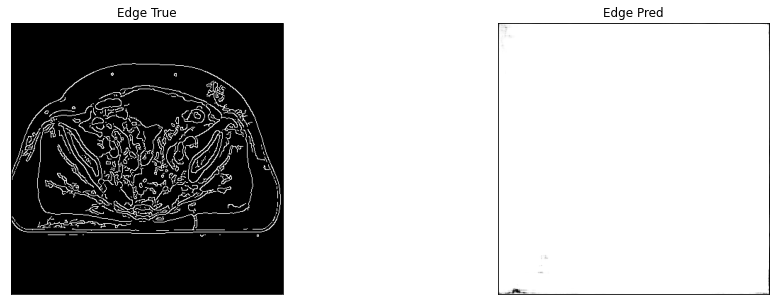

edge of ct_pred = 0.6876581311225891, edge of ct_true = 0.7059964537620544
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


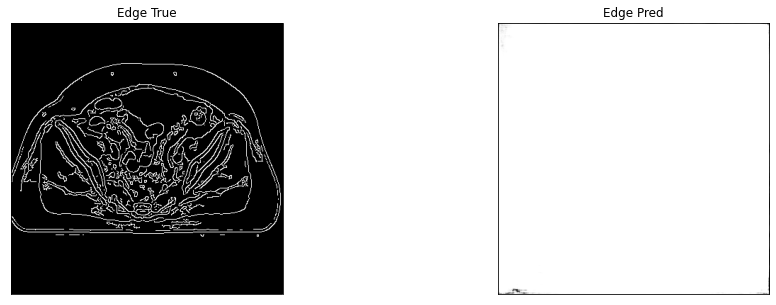

edge of ct_pred = 0.6875613927841187, edge of ct_true = 0.7033220529556274
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


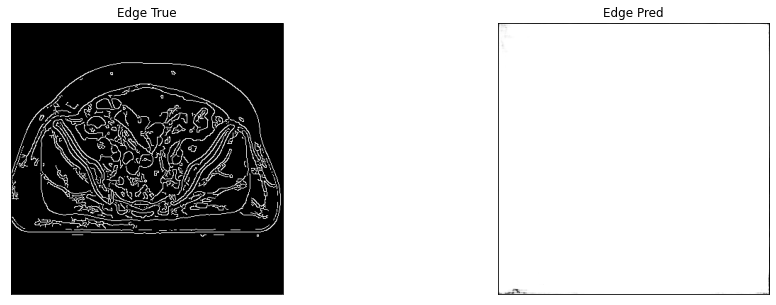

edge of ct_pred = 0.6876068115234375, edge of ct_true = 0.7039591670036316
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0046, device='cuda:0') tensor(1., device='cuda:0')


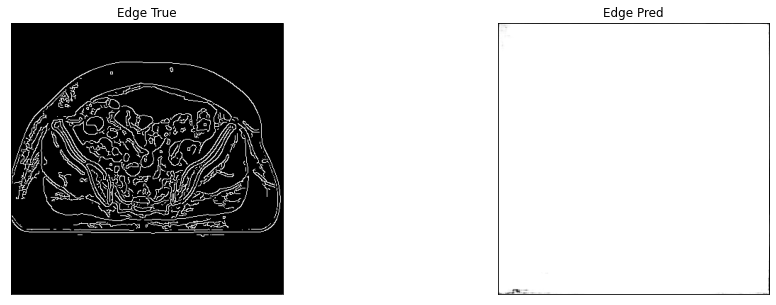

edge of ct_pred = 0.6877213716506958, edge of ct_true = 0.705840528011322
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0005, device='cuda:0') tensor(1., device='cuda:0')


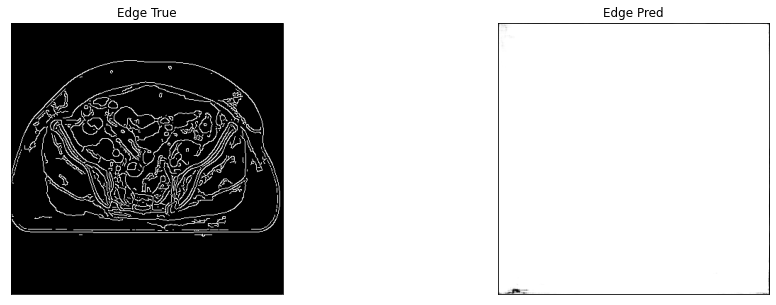

edge of ct_pred = 0.6877254843711853, edge of ct_true = 0.7053608298301697
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0023, device='cuda:0') tensor(1., device='cuda:0')


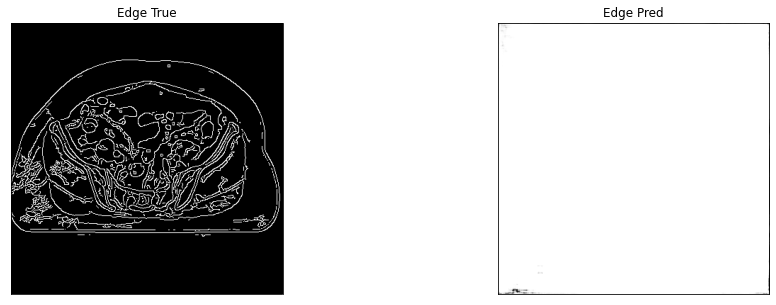

12it [00:27,  2.33s/it]


In [36]:
test_epoch(model, testloader, device, True, dir_path)

In [37]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [38]:
discriminator.load_state_dict(checkpoint["dicriminator"])

<All keys matched successfully>

In [39]:
# score_ssim_test, score_psnr_test, score_snr_test, score_mae_test, score_mask_test, score_acc_test 
# unmasked
eval_epoch(model, discriminator, testloader, device)

12it [00:05,  2.17it/s]


0.5

In [40]:
# import torchvision.models as models
# models.vgg16(pretrained=True)